# 1.1 Neural Networks NLP

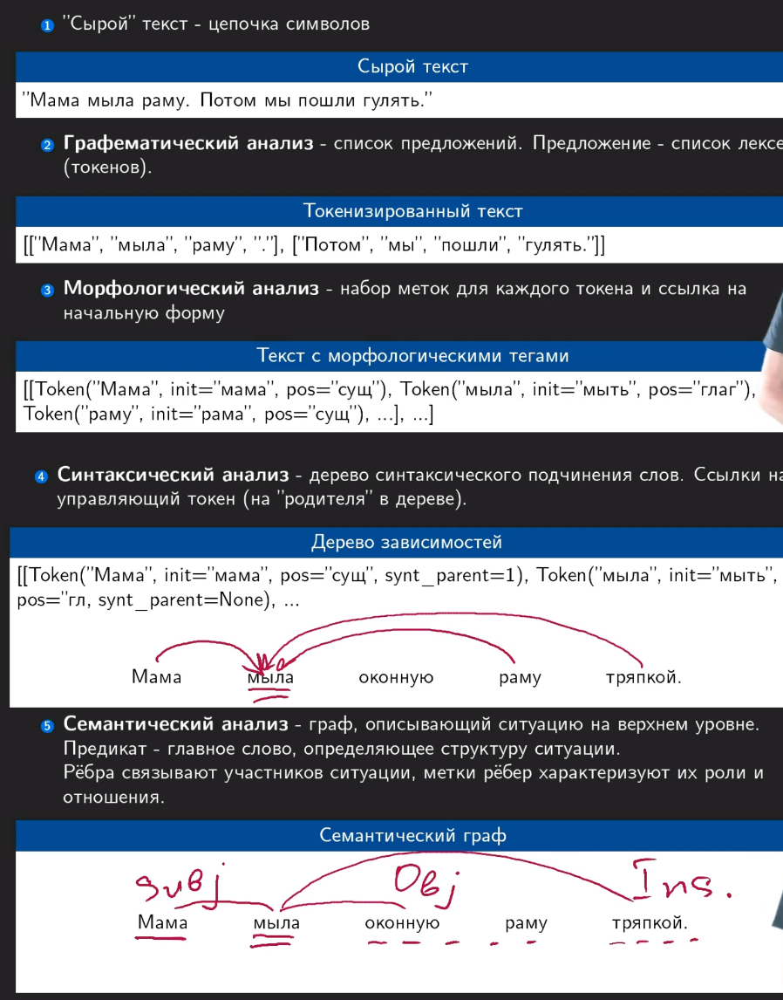

In [10]:
from IPython.display import Image #display picture
Image('text-analize.png')

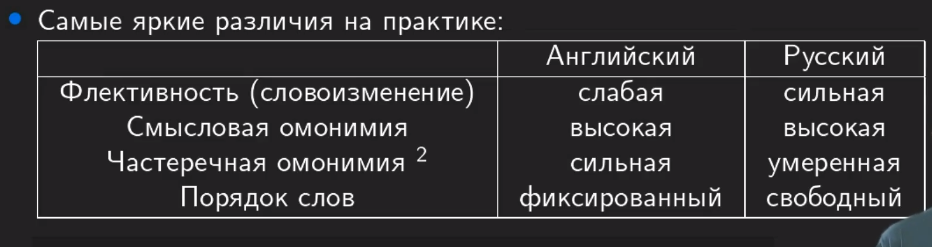

In [2]:
Image('language-dif.png')

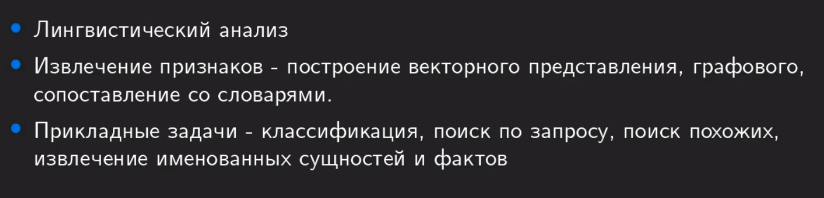

In [1]:
#методы анализа
#Лингвистический анализ - разбор структуры текста
#Извлечение признаков
#Прикладные задачи - классификация
from IPython.display import Image #display picture
Image('text-analize1.png')

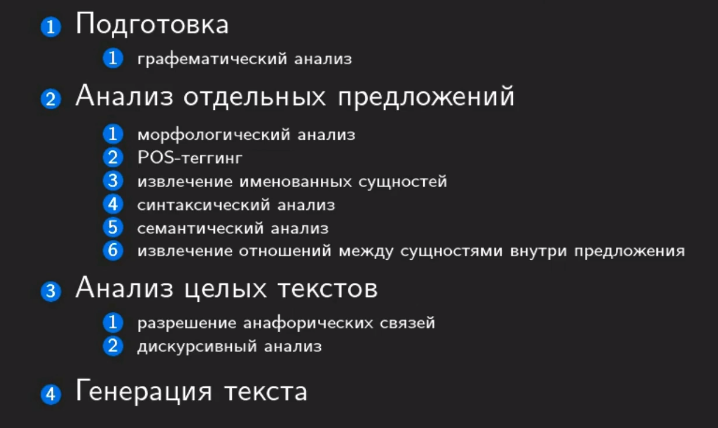

In [1]:
#Лингвистический анализ
from IPython.display import Image #display picture
Image('Untitled.png')

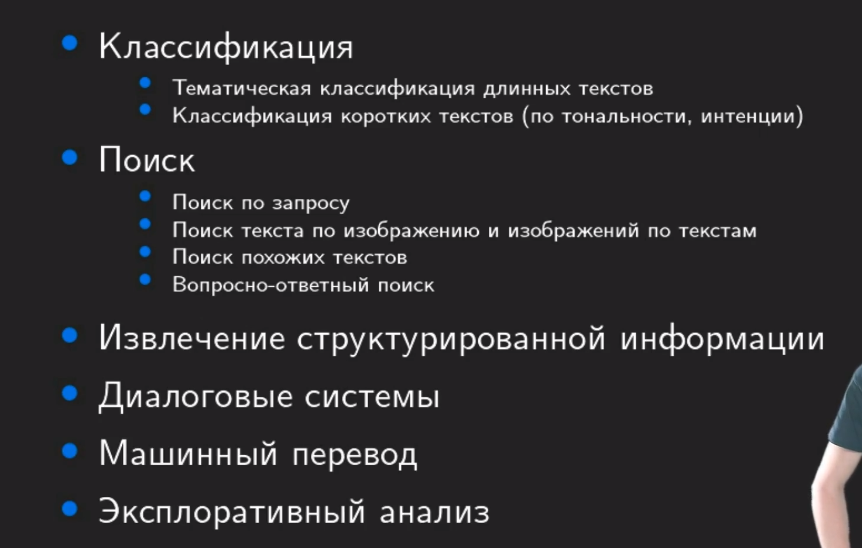

In [1]:
#Прикладные задачи
from IPython.display import Image #display picture
Image('Untitled1.png')

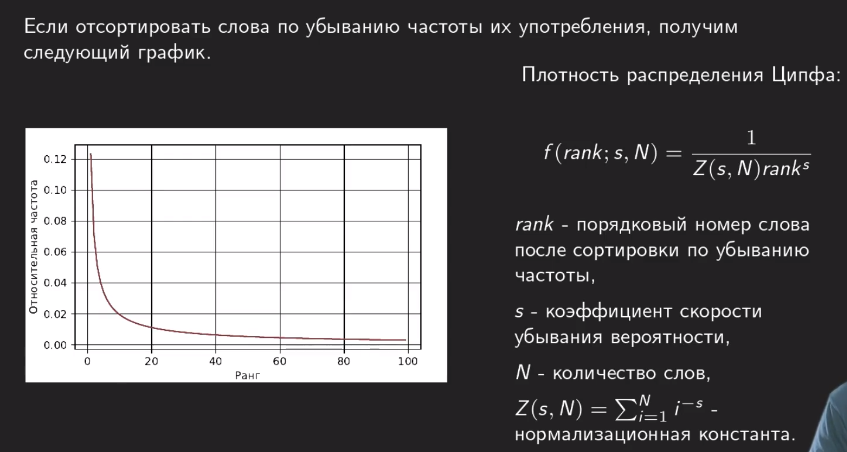

In [1]:
#закон распределения ципфа
from IPython.display import Image #display picture
Image('Untitled3.png')

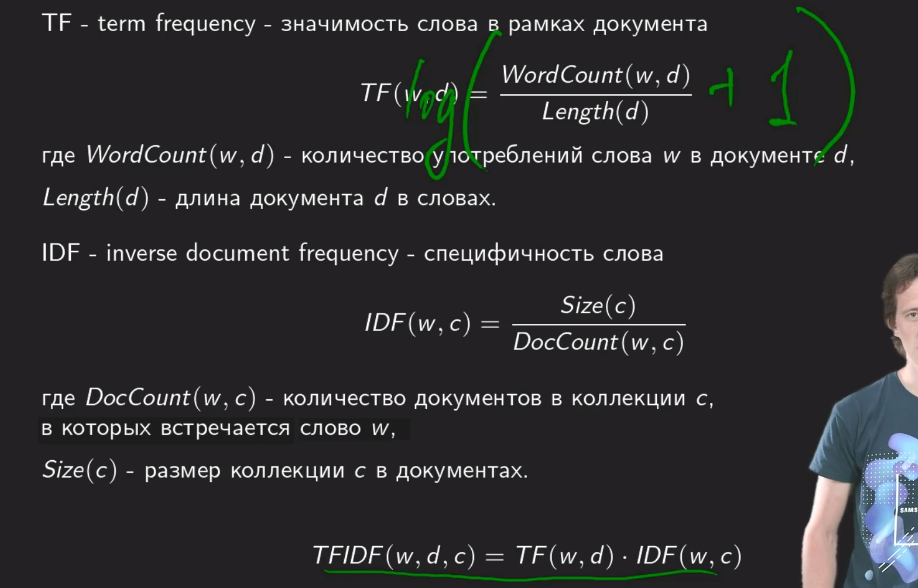

In [6]:
Image('Untitled5.png')

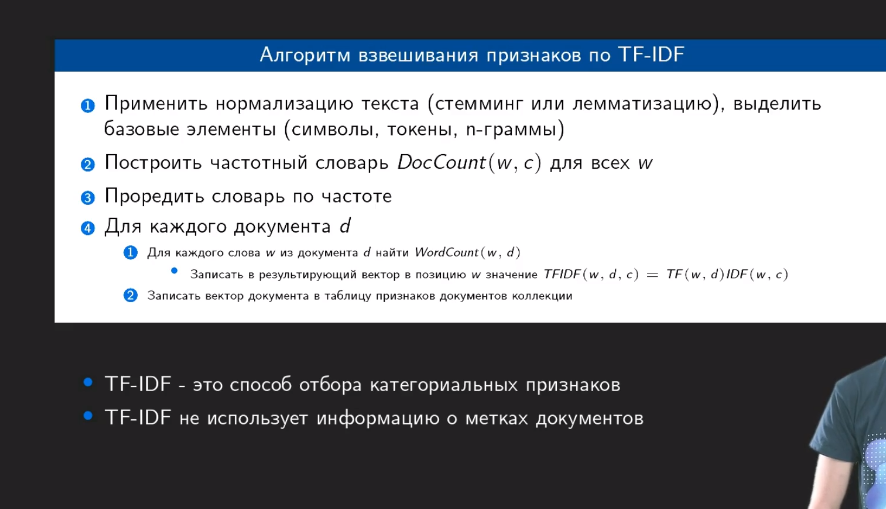

In [9]:
Image('Untitled6.png')

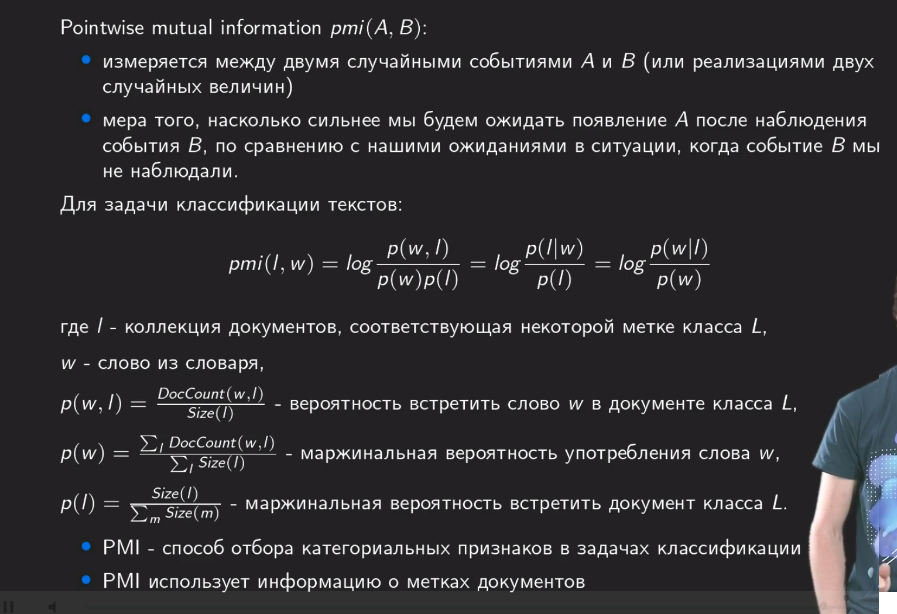

In [11]:
Image('Untitled7.png')

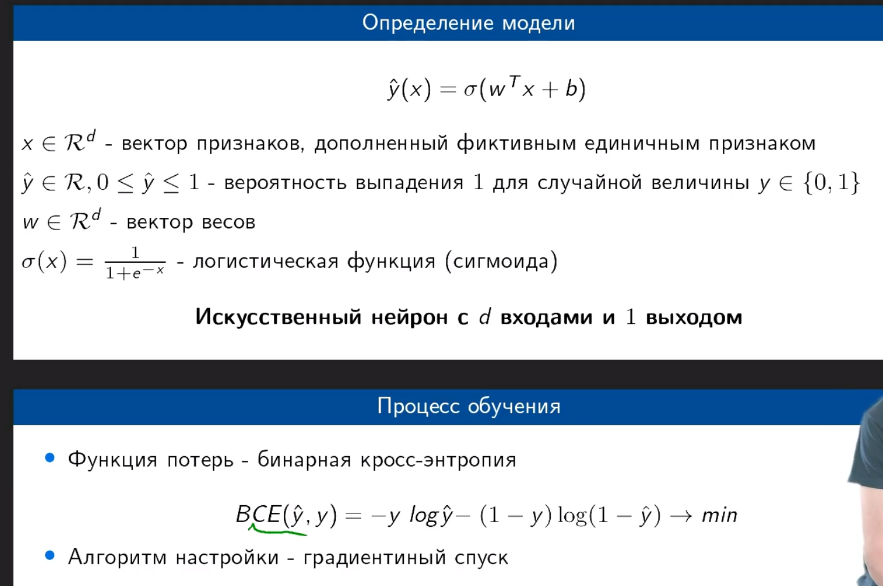

In [2]:
from IPython.display import Image #display picture
Image('Untitled8.png')

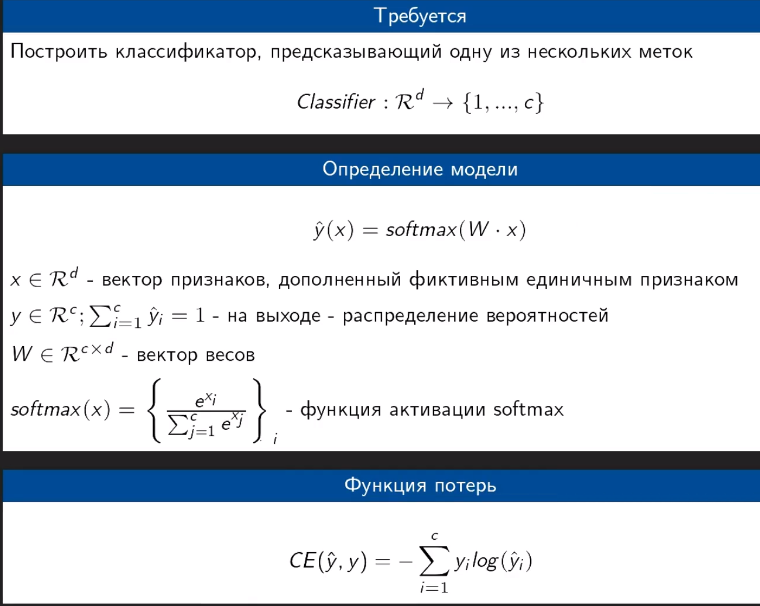

In [3]:
Image('Untitled9.png')

In [7]:
#Кросс-энтропия сильно штрафует за сильные ошибки и за неуверенность. 
#На практике это может приводить к тому, что обученная модель чрезмерно "уверена" в своих предсказаниях 
#- значения вероятностей становятся близки к 0 или 1. Поэтому использовать предсказания модели как оценку 
#достоверности предсказаний надо с большой осторожностью. В случае с логистической регрессией калибровка 
#(адекватность оценки вероятности) может быть неплохой, но в случае с глубокими нейросетями это чаще всего не так.

In [ ]:
from math import log

def TBCE(y_pred, y_true=(1, 1)):
    r = 0
    for i in range(len(y_true)):
        r+=BCE(y_pred[i], y_true[i])
    return r

def BCE(y_hat, y):
    result = -y*log(y_hat)-(1-y)*log(1-y_hat)
    return result

print(TBCE([0.99, 0.45]), TBCE([0.99, 0.01]))
print(TBCE([0.99, 0.01]), TBCE([0.5,0.5]))
print(TBCE([0.5,0.5]), TBCE([0.99, 0.01]))
print(TBCE([0.99,0.45]), TBCE([0.65,0.65]) )
print(TBCE([0.99, 0.01]), TBCE([0.99, 0.45]))

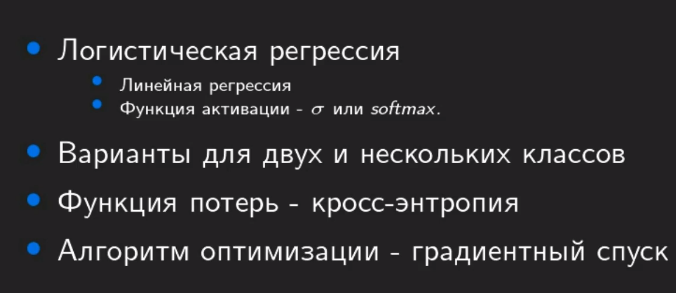

In [8]:
Image('Untitled10.png')

In [2]:
#import sys
#!pip install -r requirements.txt

  Using cached https://files.pythonhosted.org/packages/af/25/e2f9863b78e5aef61bc0475bfac39f56197103f767e6f2e957cc67b989f2/youtokentome-1.0.5.tar.gz
  Using cached https://files.pythonhosted.org/packages/2c/6e/c325d0db05ac1b8d45645de903e4ba691d419e861c915c3d4ebfcaf8ac25/pyconll-2.2.1-py3-none-any.whl
  Running setup.py clean for youtokentome
Failed to build youtokentome
  Running setup.py install for youtokentome: started
    Running setup.py install for youtokentome: finished with status 'error'


  ERROR: Command errored out with exit status 1:
   command: 'C:\Users\Titan\Anaconda3\python.exe' -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\Titan\\AppData\\Local\\Temp\\pip-install-uu12cbdp\\youtokentome\\setup.py'"'"'; __file__='"'"'C:\\Users\\Titan\\AppData\\Local\\Temp\\pip-install-uu12cbdp\\youtokentome\\setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d 'C:\Users\Titan\AppData\Local\Temp\pip-wheel-cdcd4253' --python-tag cp37
       cwd: C:\Users\Titan\AppData\Local\Temp\pip-install-uu12cbdp\youtokentome\
  Complete output (12 lines):
  running bdist_wheel
  running build
  running build_py
  creating build
  creating build\lib.win-amd64-3.7
  creating build\lib.win-amd64-3.7\youtokentome
  copying youtokentome\youtokentome.py -> build\lib.win-amd64-3.7\youtokentome
  copying youtokentome\yttm_cli.py -> build\lib.wi

# 1.2 Тематическая классификация длинных текстов - TFIDF и LogReg

In [16]:
# Если Вы запускаете ноутбук на colab или kaggle,
# выполните следующие строчки, чтобы подгрузить библиотеку dlnlputils:

# !git clone https://github.com/Samsung-IT-Academy/stepik-dl-nlp.git && pip install -r stepik-dl-nlp/requirements.txt
# import sys; sys.path.append('./stepik-dl-nlp')

In [17]:
import warnings
warnings.filterwarnings('ignore')

from sklearn.datasets import fetch_20newsgroups
from sklearn.metrics import accuracy_score

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import collections

import torch
from torch import nn
from torch.nn import functional as F

import dlnlputils
from dlnlputils.data import tokenize_text_simple_regex, tokenize_corpus, build_vocabulary, \
    vectorize_texts, SparseFeaturesDataset
from dlnlputils.pipeline import train_eval_loop, predict_with_model, init_random_seed

init_random_seed()

## Предобработка текстов и подготовка признаков

In [18]:
train_source = fetch_20newsgroups(subset='train')
test_source = fetch_20newsgroups(subset='test')

print('Количество обучающих текстов', len(train_source['data']))
print('Количество тестовых текстов', len(test_source['data']))
print()
print(train_source['data'][0].strip())

print()
print('Метка', train_source['target'][0])

Количество обучающих текстов 11314
Количество тестовых текстов 7532

From: lerxst@wam.umd.edu (where's my thing)
Subject: WHAT car is this!?
Nntp-Posting-Host: rac3.wam.umd.edu
Organization: University of Maryland, College Park
Lines: 15

 I was wondering if anyone out there could enlighten me on this car I saw
the other day. It was a 2-door sports car, looked to be from the late 60s/
early 70s. It was called a Bricklin. The doors were really small. In addition,
the front bumper was separate from the rest of the body. This is 
all I know. If anyone can tellme a model name, engine specs, years
of production, where this car is made, history, or whatever info you
have on this funky looking car, please e-mail.

Thanks,
- IL
   ---- brought to you by your neighborhood Lerxst ----

Метка 7


### Подготовка признаков

In [19]:
#/-?\d*[.,]?d+|[А-ЯЁа-яё]+|[^А-ЯЁа-яё0-9]?/

In [20]:
#-?\d*[.,]?\d+

In [21]:
train_tokenized = tokenize_corpus(train_source['data']) #токенизация по регулярному выражению
test_tokenized = tokenize_corpus(test_source['data'])

print(' '.join(train_tokenized[0]))

from lerxst where thing subject what this nntp posting host rac3 organization university maryland college park lines wondering anyone there could enlighten this other door sports looked from late early called bricklin doors were really small addition front bumper separate from rest body this know anyone tellme model name engine specs years production where this made history whatever info have this funky looking please mail thanks brought your neighborhood lerxst


In [22]:
MAX_DF = 0.8   #токены, встречающиеся более чем в 80% документов выкидываются
MIN_COUNT = 5 #токеты встречающиеся меньше 5 раз выкидываются
vocabulary, word_doc_freq = build_vocabulary(train_tokenized, 
                                             max_doc_freq=MAX_DF, 
                                             min_count=MIN_COUNT)
UNIQUE_WORDS_N = len(vocabulary)
print('Количество уникальных токенов', UNIQUE_WORDS_N)
print(list(vocabulary.items())[:10])

Количество уникальных токенов 21628
[('that', 0), ('this', 1), ('have', 2), ('with', 3), ('writes', 4), ('article', 5), ('posting', 6), ('host', 7), ('nntp', 8), ('there', 9)]


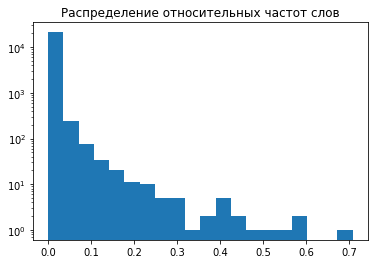

In [444]:
plt.hist(word_doc_freq, bins=20)
plt.title('Распределение относительных частот слов')
plt.yscale('log');

In [445]:
VECTORIZATION_MODE = 'tfidf'
train_vectors = vectorize_texts(train_tokenized, vocabulary, word_doc_freq, 
                                mode=VECTORIZATION_MODE)
test_vectors = vectorize_texts(test_tokenized, vocabulary, word_doc_freq, 
                               mode=VECTORIZATION_MODE)

print('Размерность матрицы признаков обучающей выборки', train_vectors.shape)
print('Размерность матрицы признаков тестовой выборки', train_vectors.shape)
print()
print('Количество ненулевых элементов в обучающей выборке', train_vectors.nnz)
print('Процент заполненности матрицы признаков {:.2f}%'.format(train_vectors.nnz * 100 / (train_vectors.shape[0] * train_vectors.shape[1])))
print()
print('Количество ненулевых элементов в обучающей выборке', test_vectors.nnz)
print('Процент заполненности матрицы признаков {:.2f}%'.format(test_vectors.nnz * 100 / (test_vectors.shape[0] * test_vectors.shape[1])))

Размерность матрицы признаков обучающей выборки (11314, 21628)
Размерность матрицы признаков тестовой выборки (11314, 21628)

Количество ненулевых элементов в обучающей выборке 1126792
Процент заполненности матрицы признаков 0.46%

Количество ненулевых элементов в обучающей выборке 721529
Процент заполненности матрицы признаков 0.44%


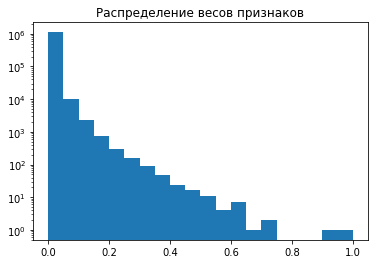

In [446]:
plt.hist(train_vectors.data, bins=20)
plt.title('Распределение весов признаков')
plt.yscale('log');

### Распределение классов

In [447]:
UNIQUE_LABELS_N = len(set(train_source['target']))
print('Количество уникальных меток', UNIQUE_LABELS_N)

Количество уникальных меток 20


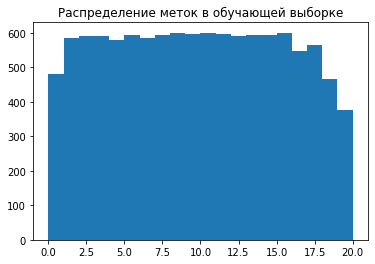

In [448]:
plt.hist(train_source['target'], bins=np.arange(0, 21))
plt.title('Распределение меток в обучающей выборке');

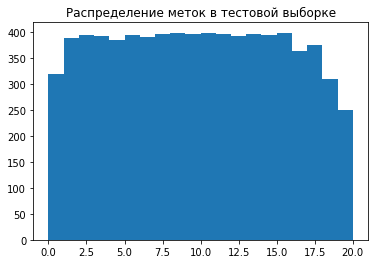

In [449]:
plt.hist(test_source['target'], bins=np.arange(0, 21))
plt.title('Распределение меток в тестовой выборке');

### PyTorch Dataset

In [450]:
train_dataset = SparseFeaturesDataset(train_vectors, train_source['target'])
test_dataset = SparseFeaturesDataset(test_vectors, test_source['target'])

## Обучение модели на PyTorch

In [451]:
model = nn.Linear(UNIQUE_WORDS_N, UNIQUE_LABELS_N)

best_val_loss, best_model = train_eval_loop(model=model,
                                            train_dataset=train_dataset,
                                            val_dataset=test_dataset,
                                            criterion=F.cross_entropy,
                                            lr=1e-1,
                                            epoch_n=200,
                                            batch_size=32,
                                            l2_reg_alpha=0,
                                            lr_scheduler_ctor=lambda optim: torch.optim.lr_scheduler.ReduceLROnPlateau(optim,
                                                                                                                       patience=5,
                                                                                                                       factor=0.5,
                                                                                                                       verbose=True))

Эпоха 0
Эпоха: 354 итераций, 3.17 сек
Среднее значение функции потерь на обучении 2.2337238317155568
Среднее значение функции потерь на валидации 2.1128748650267974
Новая лучшая модель!

Эпоха 1
Эпоха: 354 итераций, 3.16 сек
Среднее значение функции потерь на обучении 0.9168973706536374
Среднее значение функции потерь на валидации 1.6850644738997442
Новая лучшая модель!

Эпоха 2
Эпоха: 354 итераций, 3.13 сек
Среднее значение функции потерь на обучении 0.46728824137967856
Среднее значение функции потерь на валидации 1.472018151970233
Новая лучшая модель!

Эпоха 3
Эпоха: 354 итераций, 3.08 сек
Среднее значение функции потерь на обучении 0.28390089940216584
Среднее значение функции потерь на валидации 1.3453948452311046
Новая лучшая модель!

Эпоха 4
Эпоха: 354 итераций, 3.13 сек
Среднее значение функции потерь на обучении 0.19136790849142155
Среднее значение функции потерь на валидации 1.2646845235662945
Новая лучшая модель!

Эпоха 5
Эпоха: 354 итераций, 3.17 сек
Среднее значение функции 

## Оценка качества

In [23]:
train_pred = predict_with_model(best_model, train_dataset)

train_loss = F.cross_entropy(torch.from_numpy(train_pred),
                             torch.from_numpy(train_source['target']).long())

print('Среднее значение функции потерь на обучении', float(train_loss))
print('Доля верных ответов', accuracy_score(train_source['target'], train_pred.argmax(-1)))
print()



test_pred = predict_with_model(best_model, test_dataset)

test_loss = F.cross_entropy(torch.from_numpy(test_pred),
                            torch.from_numpy(test_source['target']).long())

print('Среднее значение функции потерь на валидации', float(test_loss))
print('Доля верных ответов', accuracy_score(test_source['target'], test_pred.argmax(-1)))

NameError: name 'best_model' is not defined

In [453]:
train_pred = predict_with_model(best_model, train_dataset)
train_loss = F.cross_entropy(torch.from_numpy(train_pred), torch.from_numpy(train_source['target']).long())
print('Среднее значение функции потерь на обучении', float(train_loss))
print('Доля верных ответов', accuracy_score(train_source['target'], train_pred.argmax(-1)))
print()

test_pred = predict_with_model(best_model, test_dataset)
test_loss = F.cross_entropy(torch.from_numpy(test_pred), torch.from_numpy(test_source['target']).long())
print('Среднее значение функции потерь на валидации', float(test_loss))
print('Доля верных ответов', accuracy_score(test_source['target'], test_pred.argmax(-1)))

354it [00:02, 157.82it/s]                                                      


Среднее значение функции потерь на обучении 0.004174983128905296
Доля верных ответов 0.9992929114371575



236it [00:01, 158.70it/s]                                                      


Среднее значение функции потерь на валидации 0.9288815259933472
Доля верных ответов 0.7712426978226234


# 1.3 Альтернативная реализация на scikit-learn

In [24]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

sklearn_pipeline = Pipeline((('vect', TfidfVectorizer(tokenizer=tokenize_text_simple_regex,
                                                      max_df=MAX_DF,
                                                      min_df=MIN_COUNT)),
                             ('cls', LogisticRegression())))
sklearn_pipeline.fit(train_source['data'], train_source['target']);

## Оценка качества

In [25]:
sklearn_train_pred = sklearn_pipeline.predict_proba(train_source['data'])
sklearn_train_loss = F.cross_entropy(torch.from_numpy(sklearn_train_pred),
                                                 torch.from_numpy(train_source['target']).long())
print('Среднее значение функции потерь на обучении', float(sklearn_train_loss))
print('Доля верных ответов', accuracy_score(train_source['target'], sklearn_train_pred.argmax(-1)))
print()

sklearn_test_pred = sklearn_pipeline.predict_proba(test_source['data'])
sklearn_test_loss = F.cross_entropy(torch.from_numpy(sklearn_test_pred),
                                                torch.from_numpy(test_source['target']).long())
print('Среднее значение функции потерь на валидации', float(sklearn_test_loss))
print('Доля верных ответов', accuracy_score(test_source['target'], sklearn_test_pred.argmax(-1)))

Среднее значение функции потерь на обучении 2.495478891862309
Доля верных ответов 0.9716280714159449

Среднее значение функции потерь на валидации 2.6539022582375007
Доля верных ответов 0.8190387679235263


In [ ]:
#В качестве домашнего задания мы предлагаем Вам поэкспериментировать с кодом этого семинара, чтобы попробовать 
#улучшить качество на отложенной выборке. Что можно попробовать сделать:

#изменить способ взвешивания признаков
#реализовать взвешивание признаков с помощью точечной взаимной информации (PMI)
#изменить способ стандартизации данных (см. начиная с 4:25 на шаге 6), например, запоминая сдвиг и масштаб с 
#обучающей выборки и применяя эти параметры для стандартизации тестовой выборки; и/или стандартизируя каждый 
#столбец по отдельности
#добавить регуляризацию
#извлекать признаки не через токены, а через N-граммы
#добавить стемминг или простую лемматизацию
#изменить архитектуру нейросети, например, сделав два слоя вместо одного
#проанализировать, как сильно падает качество классификации с уменьшением размера словаря (для фильтрации словаря 
#можно использовать разные эвристики, например, тот же PMI)
#Также мы предлагаем Вам не ограничиваться этим списком, а придумать свои способы улучшить качество классификации.

#Опишите то, что у Вас получилось, в ответе к этому шагу.

#Балл за этот шаг зачитывается автоматически, вне зависимости от текста, который Вы впишете в поле ответа :). 
#Но то, насколько этот семинар и это задание будет полезным для Вас, вполне зависит - так что мы предлагаем 
#Вам поисследовать возможности линейных моделей и подробно описать свой опыт. К тому же, после нажатия кнопки 
#"Отправить" Вы получите доступ к ответам других участников и сможете обменяться своими находками.

#Успехов! :)

In [ ]:
#Использовал взвешивание с помощью PMI, детальное объяснение получил здесь - 
#http://www.ccs.neu.edu/home/luwang/courses/cs6120_sp2018/slides_cs6120_sp18/semantics_part1.pdf
#Немного улучшилось качество модели после применение StandardScaler 
#L1, L2 Regularization позволили избежать переобучения в большей модели
#Для этого корпуса лемматизация дала слабый прирост по сравнению со стемингом, но для русского думаю было бы лучше
#Использовал аугментацию с помощью заменой синонимами(из библиотеки nltk)
#Через X^2 и бустинг отбирал важные слова и на них обучал другие модели, кривая ухудшения качества 
#была похожа на возрастающий логарифм

# 1.4 Задача 

In [397]:
txt_1 = ["Казнить нельзя, помиловать. Нельзя наказывать.",

"Казнить, нельзя помиловать. Нельзя освободить.",

"Нельзя не помиловать.",

"Обязательно освободить."]

txt_1_tokenized = tokenize_corpus(txt_1, min_token_size=2)

In [398]:
txt_1_tokenized

[['казнить', 'нельзя', 'помиловать', 'нельзя', 'наказывать'],
 ['казнить', 'нельзя', 'помиловать', 'нельзя', 'освободить'],
 ['нельзя', 'не', 'помиловать'],
 ['обязательно', 'освободить']]

In [399]:
MAX_DF = 1
MIN_COUNT = 1
vocabulary_1, word_doc_freq_1 = build_vocabulary(txt_1_tokenized, max_doc_freq=MAX_DF, min_count=MIN_COUNT)

In [400]:
word_doc_freq_1.sort()
word_doc_freq_1.astype('float32')

array([0.25, 0.25, 0.25, 0.5 , 0.5 , 0.75, 0.75], dtype=float32)

In [401]:
word_df = [('нельзя', 0.75), ('помиловать', 0.75), ('казнить', 0.5),
 ('освободить', 0.5), ('наказывать', 0.25), ('не', 0.25), ('обязательно', 0.25)]

answer = sorted(word_df, key=lambda x:(x[1],x[0]))

answer_1 = []; 
answer_2 = [];

for k, v in list(answer):
    answer_1.append(k)
    answer_2.append(str(v))
    
print(" ".join(answer_1))
print(" ".join(answer_2))

наказывать не обязательно казнить освободить нельзя помиловать
0.25 0.25 0.25 0.5 0.5 0.75 0.75


In [402]:
vocabulary_1 = {word: i for i, word in enumerate(answer_1)}
vocabulary_1

{'наказывать': 0,
 'не': 1,
 'обязательно': 2,
 'казнить': 3,
 'освободить': 4,
 'нельзя': 5,
 'помиловать': 6}

In [403]:
tokenized_texts, word2id, word2freq, mode, scale = txt_1_tokenized, vocabulary_1, np.array(answer_2), 'tfidf', True

# считаем количество употреблений каждого слова в каждом документе
result = np.zeros((len(tokenized_texts), len(word2id)), dtype='float32')
for text_i, text in enumerate(tokenized_texts):
    for token in text:
         if token in word2id:
            result[text_i, word2id[token]] += 1

In [404]:
np.log(result / result.sum(1, keepdims=True)+1)

array([[0.1823216 , 0.        , 0.        , 0.1823216 , 0.        ,
        0.3364722 , 0.1823216 ],
       [0.        , 0.        , 0.        , 0.1823216 , 0.1823216 ,
        0.3364722 , 0.1823216 ],
       [0.        , 0.28768212, 0.        , 0.        , 0.        ,
        0.28768212, 0.28768212],
       [0.        , 0.        , 0.4054651 , 0.        , 0.4054651 ,
        0.        , 0.        ]], dtype=float32)

In [405]:
result = np.log(result / result.sum(1, keepdims=True)+1)  # разделить каждую строку на её длину

In [406]:
result = result / word2freq.astype('float32')  # разделить каждый столбец на вес слова

In [407]:
result

array([[0.7292864 , 0.        , 0.        , 0.3646432 , 0.        ,
        0.44862962, 0.24309546],
       [0.        , 0.        , 0.        , 0.3646432 , 0.3646432 ,
        0.44862962, 0.24309546],
       [0.        , 1.1507285 , 0.        , 0.        , 0.        ,
        0.38357615, 0.38357615],
       [0.        , 0.        , 1.6218604 , 0.        , 0.8109302 ,
        0.        , 0.        ]], dtype=float32)

In [408]:
result -= result.mean(0)
result /= (result.std(0, ddof=1))

In [409]:
for i in result:
    print('')
    for j in i:
        print(j, end=' ')


1.5000001 -0.5 -0.5 0.8660254 -0.76301265 0.59546685 0.16096792 
-0.50000006 -0.5 -0.5 0.8660254 0.18368238 0.59546685 0.16096792 
-0.50000006 1.5 -0.5 -0.8660254 -0.76301265 0.2938242 1.042435 
-0.50000006 -0.5 1.5 -0.8660254 1.342343 -1.4847579 -1.364371 

In [428]:
import numpy as np
import pandas as pd
import re
from scipy.sparse import dok_matrix, csr_matrix

import warnings
warnings.filterwarnings('ignore')


def build_vocabulary(collection):
  vocabulary = pd.DataFrame([0], index=['unknown'], columns=['DF'])
  for doc in collection:
    for token in set(doc):
      if token in vocabulary.index:
        vocabulary.loc[token, 'DF'] += 1 / len(collection)
      else:
        vocabulary.loc[token, 'DF'] = 1 / len(collection)
  return vocabulary.sort_index().sort_values('DF').reset_index().rename(columns={'index': 'token'})


def vectorize_collection(collection, vocabulary, mode='tfidf', scale=None):
  assert mode in {'logtfidf', 'tfidf', 'idf', 'tf', 'bin'}
  assert scale in {'minmax', 'z', None}

  result = dok_matrix((len(collection), len(vocabulary)), dtype='float32')
  for i, doc in enumerate(collection):
    for token in doc:
      if token in vocabulary.token.values:
        result[i, vocabulary.index[vocabulary.token == token]] += 1

  if mode == 'bin':
    result = (result > 0).astype('float32')

  elif mode == 'tf':
    result = result.tocsr().multiply(1 / result.sum(1))

  elif mode == 'idf':
    result = (result > 0).astype('float32').multiply(1 / vocabulary.DF)

  elif mode == 'tfidf':
    result = result.tocsr().multiply(1 / result.sum(1)).multiply(1 / vocabulary.DF)

  elif mode == 'logtfidf':
    result = csr_matrix(np.log((result.tocsr().multiply(1 / result.sum(1))).todense() + 1)).multiply(1 / vocabulary.DF)

  if scale == 'minmax':
    result = result.tocsc()
    result -= result.min()
    result /= (result.max() + 1e-6)

  if scale == 'z':
    result = result.tocsc()
    result -= result.mean(0)
    result /= result.std(0, ddof=1)

  return csr_matrix(result)


collection = [
              'Казнить нельзя, помиловать. Нельзя наказывать.',
              'Казнить, нельзя помиловать. Нельзя освободить.',
              'Нельзя не помиловать.',
              'Обязательно освободить.'
              ]
collection = [re.findall(r'[\w\d]+', doc.lower()) for doc in collection]
vocabulary = build_vocabulary(collection)
logtfidf = vectorize_collection(collection, vocabulary, 'logtfidf', 'z').todense().round(2)

[print(*logtfidf[row][1:]) for row in range(len(collection))]

1.5 -0.5 -0.5 0.87 -0.76 0.6 0.16
-0.5 -0.5 -0.5 0.87 0.18 0.6 0.16
-0.5 1.5 -0.5 -0.87 -0.76 0.29 1.04
-0.5 -0.5 1.5 -0.87 1.34 -1.48 -1.36


[None, None, None, None]

# 1.4 Базовые нейросетевые методы работы с текстами

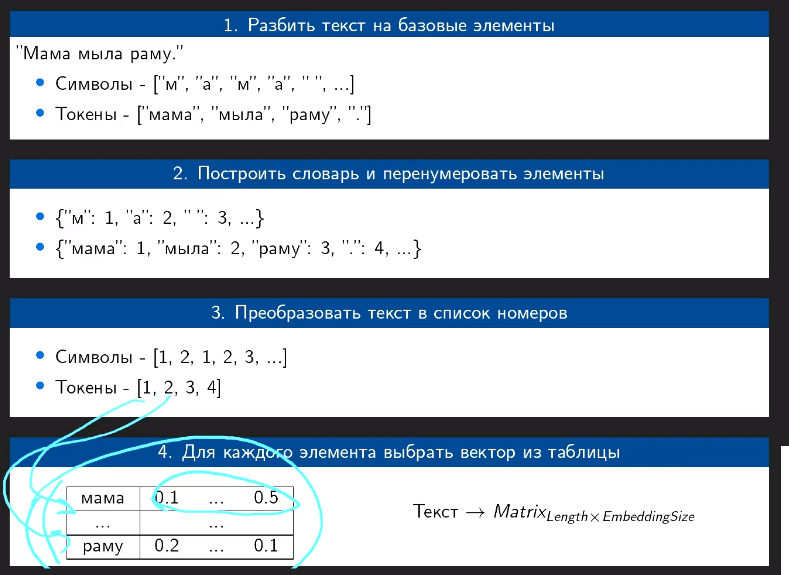

In [2]:
#предобработка текста
from IPython.display import Image #display picture
Image('Untitled20.png')

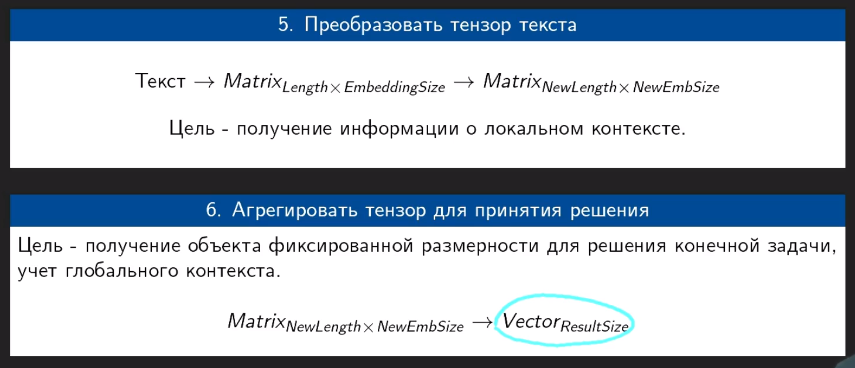

In [3]:
Image('Untitled21.png')

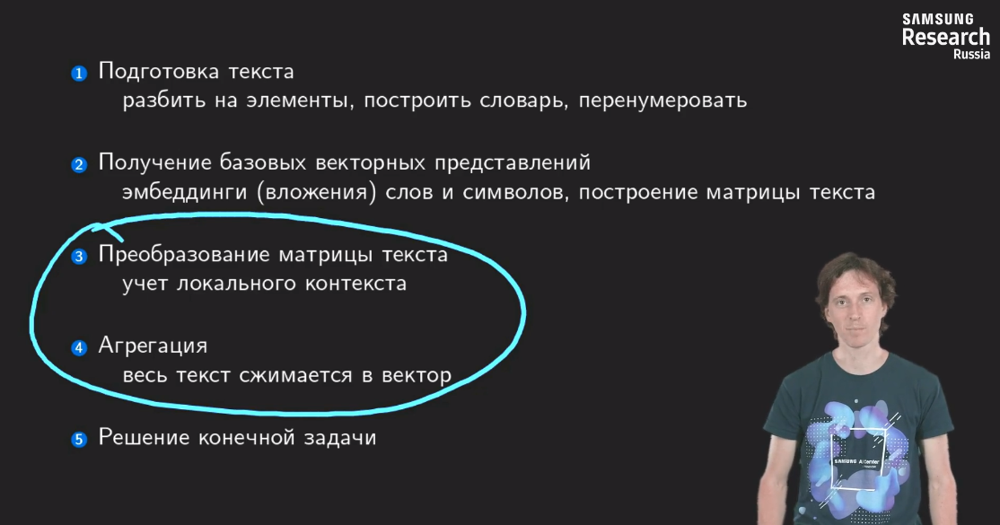

In [4]:
Image('Untitled22.png')

# 1.5 Векторизация 

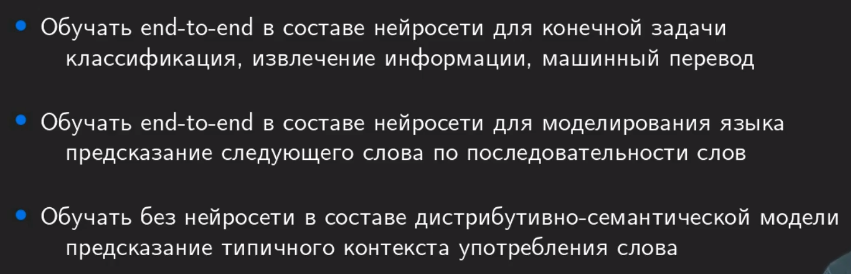

In [5]:
#виды задач
Image('Untitled23.png')

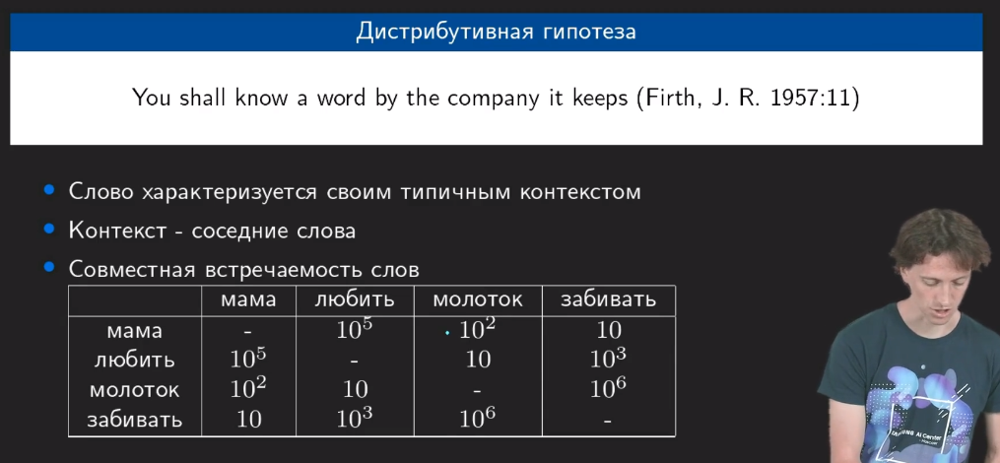

In [6]:
#совместная встречаемость слов
Image('Untitled24.png')

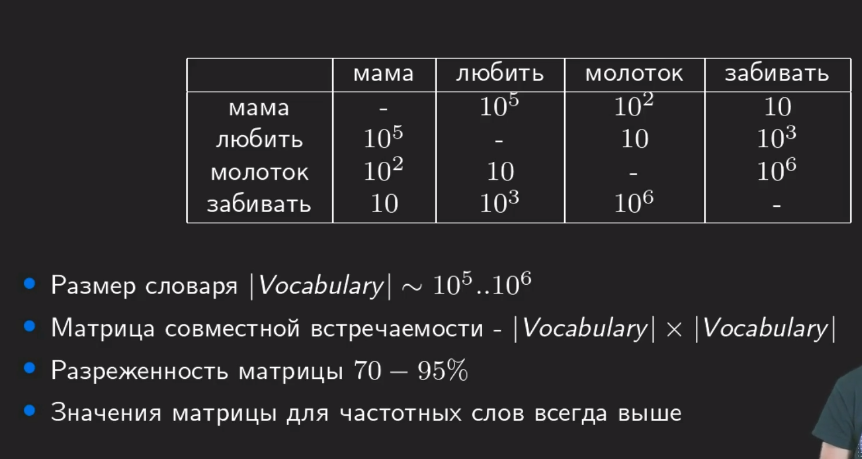

In [7]:
Image('Untitled25.png')

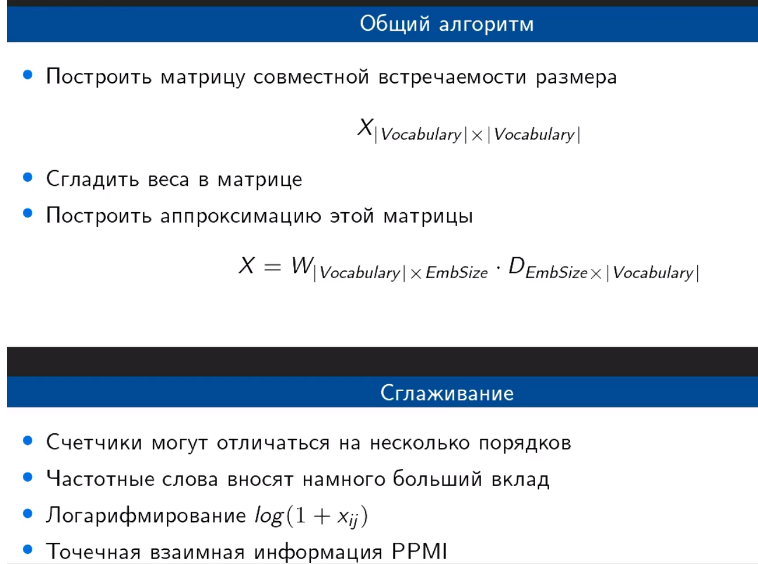

In [8]:
#Общий алгоритм
Image('Untitled26.png')

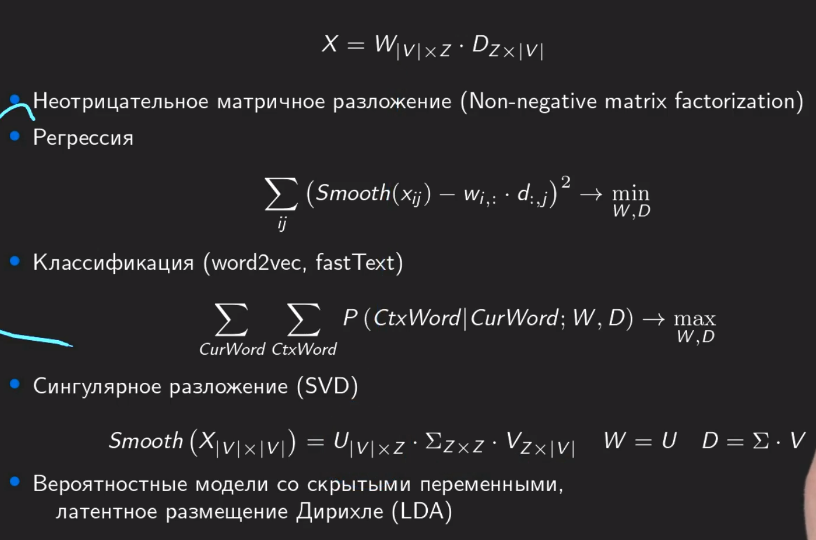

In [9]:
#способы получения матриц эмбеддингов
Image('Untitled27.png')

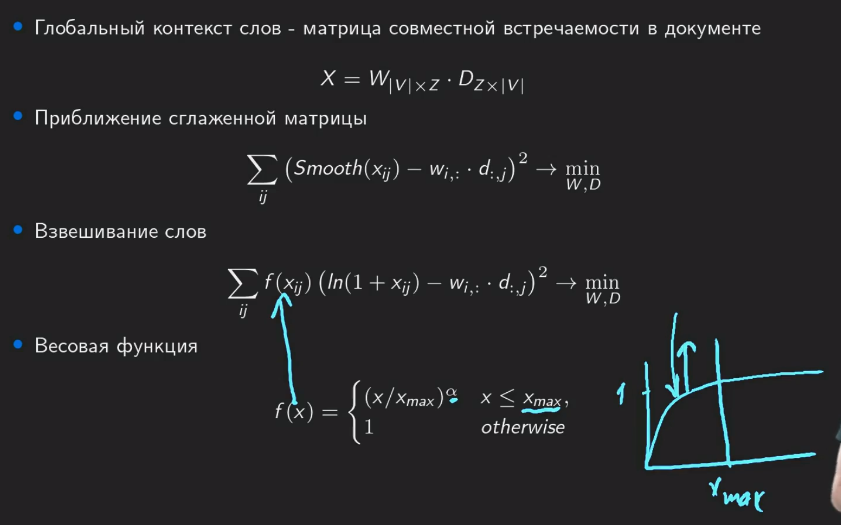

In [17]:
#Метод GloVe(регрессия)
Image('Untitled28.png')

# 1.6 Общий алгоритм обучения FastText Skip Gram Negative Sampling выглядит следующим образом:

In [ ]:
#1)Очистить и токенизировать обучающую коллекцию документов
#2)Построить словарь - подсчитать частоты всех целых токенов и N-грамм заданной длины (например, от 3 до 6 символов). 
#    При построении словаря раз в заданное число шагов прореживать словарь - удалить из словаря токены, набравшие 
#    с предыдущего прореживания меньше всего употреблений (или меньше заданного порога).
#3)Проход по корпусу скользящим окном заданной ширины, для каждой позиции окна выполнять шаги 4-7.
#4)Для текущего словоупотребления в центре окна выделить его N-граммы, содержащиеся в словаре (то есть только 
#    достаточно частотные N-граммы)
#5)Вычислить вектор центрального токена, усреднив вектора целого токена (если он есть в словаре) и всех N-грамм, 
#    выделенных на шаге 4.
#6)Выбрать случайным образом отрицательные слова (сделать negative sampling).
#7)Обновить следущие вектора так, чтобы улучшить оценку правдоподобия:
#    а)N-грамм, участвовавших в получении вектора центрального токена,
#    б)контекстные вектора всех токенов в окне, кроме центрального,
#    в)контекстные вектора отрицательных слов.
#Повторять шаги 3-7 заданное число раз или до сходимости.

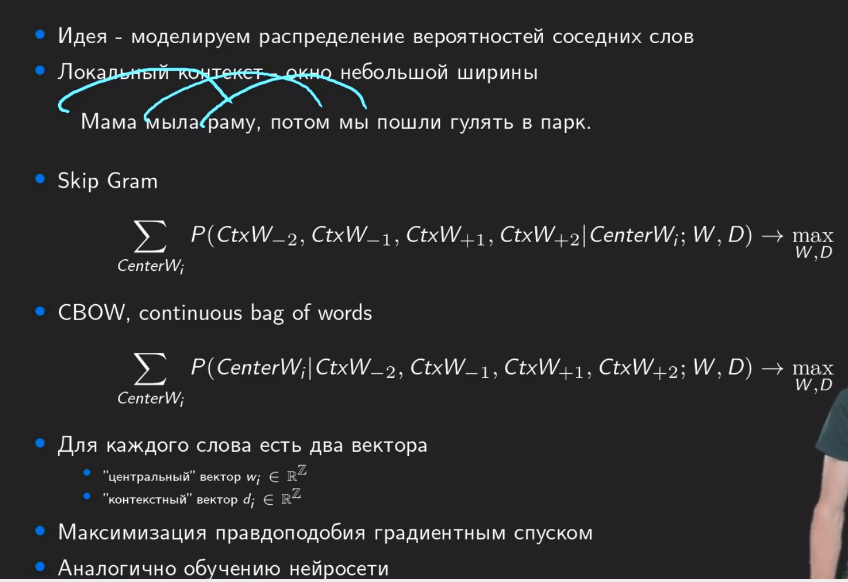

In [18]:
#word2vec
#для каждого слова настриваются два вектора:
#1)Вектор, который моделирует распределение окружающих слов вокруг центрального
#2)Вектор, который моделирует распределения центрального слова внутри окружающих
Image('Untitled29.png')

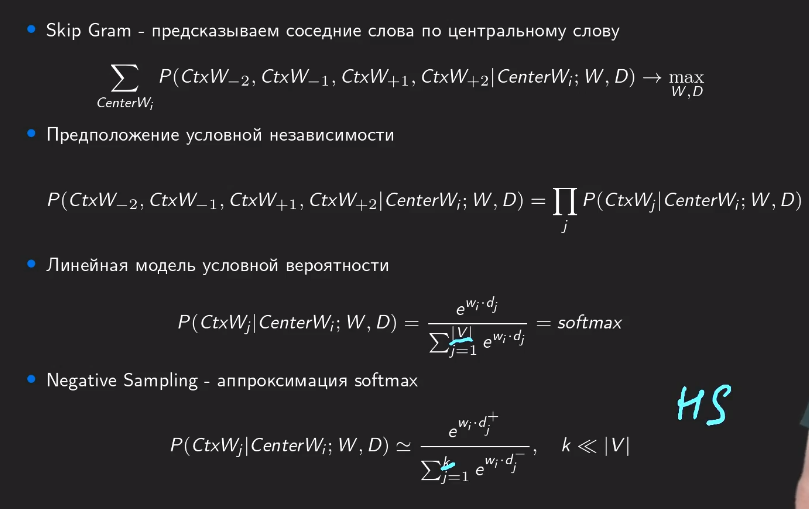

In [19]:
#SkipGram
Image('Untitled30.png')

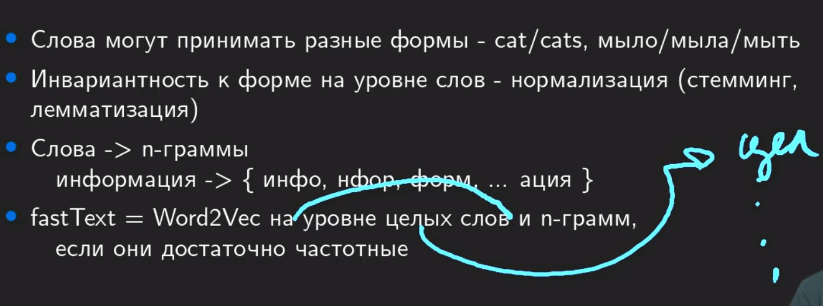

In [20]:
#fast text
Image('Untitled32.png')

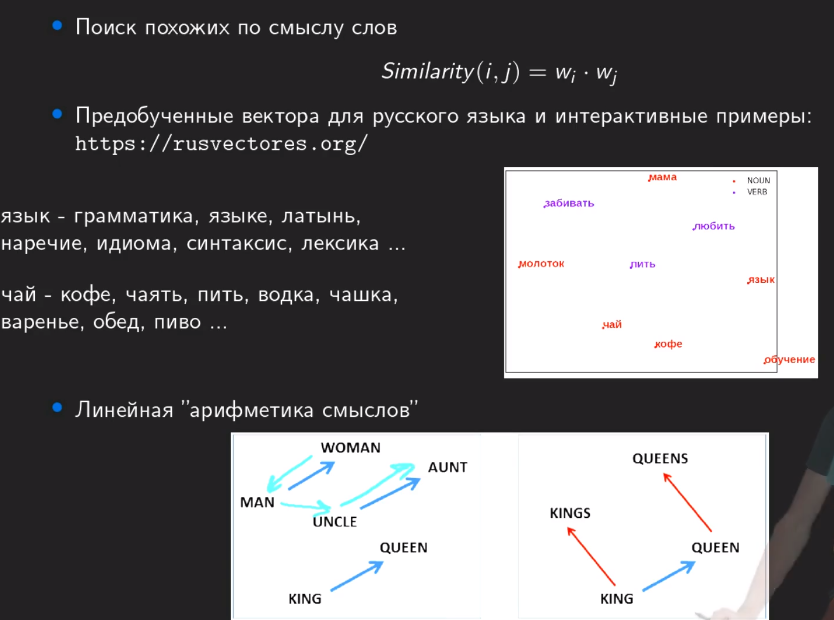

In [21]:
Image('Untitled34.png')

# 1.6 Обучение дистрибутивно-семантической модели vord2vec

# Word2Vec

In [1]:
# Если Вы запускаете ноутбук на colab или kaggle,
# выполните следующие строчки, чтобы подгрузить библиотеку dlnlputils:

# !git clone https://github.com/Samsung-IT-Academy/stepik-dl-nlp.git && pip install -r stepik-dl-nlp/requirements.txt
# import sys; sys.path.append('./stepik-dl-nlp')

In [2]:
%load_ext autoreload
%autoreload 2

import random
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import torch
from torch import nn
from torch.nn import functional as F

import dlnlputils
from dlnlputils.data import tokenize_corpus, build_vocabulary, texts_to_token_ids, \
    PaddedSequenceDataset, Embeddings
from dlnlputils.pipeline import train_eval_loop, predict_with_model, init_random_seed
from dlnlputils.visualization import plot_vectors

init_random_seed()

## Загрузка данных и подготовка корпуса

In [3]:
# Если Вы запускаете ноутбук на colab или kaggle, добавьте в начало пути ./stepik-dl-nlp
full_dataset = list(pd.read_csv('./datasets/nyt-ingredients-snapshot-2015.csv')['input'].dropna())
random.shuffle(full_dataset)

TRAIN_VAL_SPLIT = int(len(full_dataset) * 0.7)
train_source = full_dataset[:TRAIN_VAL_SPLIT]
test_source = full_dataset[TRAIN_VAL_SPLIT:]
print("Обучающая выборка", len(train_source))
print("Тестовая выборка", len(test_source))
print()
print('\n'.join(train_source[:10]))

Обучающая выборка 125344
Тестовая выборка 53719

1/4 cup sour cream
10 ounces swordfish, red snapper or other firm-fleshed fish
1 tablespoon minced basil leaves
Handful fresh parsley, finely minced
4 ounces lard or butter, plus more for brushing tops
4 to 5 green cardamom pods
1 stick ( 1/4 pound) unsalted butter, softened
1/4 teaspoon red pepper flakes, preferably Turkish or Aleppo (see note), more to taste
1 tablespoon fresh lemon juice
1/4 cup scallions, thinly sliced


In [4]:
# токенизируем
train_tokenized = tokenize_corpus(train_source)
test_tokenized = tokenize_corpus(test_source)
print('\n'.join(' '.join(sent) for sent in train_tokenized[:10]))

sour cream
ounces swordfish snapper other firm fleshed fish
tablespoon minced basil leaves
handful fresh parsley finely minced
ounces lard butter plus more brushing tops
green cardamom pods
stick pound unsalted butter softened
teaspoon pepper flakes preferably turkish aleppo note more taste
tablespoon fresh lemon juice
scallions thinly sliced


In [5]:
# строим словарь
vocabulary, word_doc_freq = build_vocabulary(train_tokenized, max_doc_freq=0.9, min_count=5, pad_word='<PAD>')
print("Размер словаря", len(vocabulary))
print(list(vocabulary.items())[:10])

Размер словаря 2267
[('<PAD>', 0), ('tablespoons', 1), ('teaspoon', 2), ('chopped', 3), ('salt', 4), ('pepper', 5), ('cups', 6), ('ground', 7), ('fresh', 8), ('tablespoon', 9)]


In [8]:
# отображаем в номера токенов
train_token_ids = texts_to_token_ids(train_tokenized, vocabulary)
test_token_ids = texts_to_token_ids(test_tokenized, vocabulary)

print('\n'.join(' '.join(str(t) for t in sent)
                for sent in train_token_ids[:10]))

222 52
22 878 574 127 246 707 181
9 19 88 33
517 8 43 15 19
22 586 20 45 47 648 649
59 329 535
200 12 50 20 266
2 5 140 78 1208 735 153 47 10
9 8 31 25
98 65 27


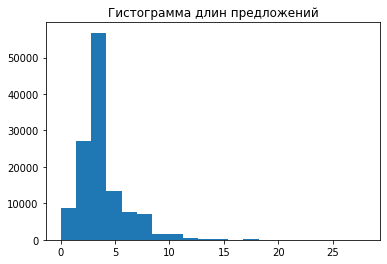

In [9]:
plt.hist([len(s) for s in train_token_ids], bins=20);
plt.title('Гистограмма длин предложений');

In [10]:
MAX_SENTENCE_LEN = 20
train_dataset = PaddedSequenceDataset(train_token_ids,
                                      np.zeros(len(train_token_ids)),
                                      out_len=MAX_SENTENCE_LEN)
test_dataset = PaddedSequenceDataset(test_token_ids,
                                     np.zeros(len(test_token_ids)),
                                     out_len=MAX_SENTENCE_LEN)
print(train_dataset[0])

(tensor([222,  52,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0]), tensor(0))


## Алгоритм обучения - Skip Gram Negative Sampling

**Skip Gram** - предсказываем соседние слова по центральному слову

**Negative Sampling** - аппроксимация softmax - предсказываем центральное слове по соседним

$$ W, D \in \mathbb{R}^{Vocab \times EmbSize} $$

$$ \sum_{CenterW_i} P(CtxW_{-2}, CtxW_{-1}, CtxW_{+1}, CtxW_{+2} | CenterW_i; W, D) \rightarrow \max_{W,D} $$

$$ P(CtxW_{-2}, CtxW_{-1}, CtxW_{+1}, CtxW_{+2} | CenterW_i; W, D) = \prod_j P(CtxW_j | CenterW_i; W, D) $$
    
$$ P(CtxW_j | CenterW_i; W, D) = \frac{e^{w_i \cdot d_j}} { \sum_{j=1}^{|V|} e^{w_i \cdot d_j}} = softmax \simeq \frac{e^{w_i \cdot d_j^+}} { \sum_{j=1}^{k} e^{w_i \cdot d_j^-}}, \quad k \ll |V| $$

In [11]:
def make_diag_mask(size, radius):
    """Квадратная матрица размера Size x Size с двумя полосами ширины radius вдоль главной диагонали"""
    idxs = torch.arange(size)
    abs_idx_diff = (idxs.unsqueeze(0) - idxs.unsqueeze(1)).abs()
    mask = ((abs_idx_diff <= radius) & (abs_idx_diff > 0)).float()
    return mask

make_diag_mask(10, 3)

tensor([[0., 1., 1., 1., 0., 0., 0., 0., 0., 0.],
        [1., 0., 1., 1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 0., 1., 1., 1., 0., 0., 0., 0.],
        [1., 1., 1., 0., 1., 1., 1., 0., 0., 0.],
        [0., 1., 1., 1., 0., 1., 1., 1., 0., 0.],
        [0., 0., 1., 1., 1., 0., 1., 1., 1., 0.],
        [0., 0., 0., 1., 1., 1., 0., 1., 1., 1.],
        [0., 0., 0., 0., 1., 1., 1., 0., 1., 1.],
        [0., 0., 0., 0., 0., 1., 1., 1., 0., 1.],
        [0., 0., 0., 0., 0., 0., 1., 1., 1., 0.]])

In [12]:
class SkipGramNegativeSamplingTrainer(nn.Module):
    def __init__(self, vocab_size, emb_size, sentence_len, radius=5, negative_samples_n=5):
        super().__init__()
        self.vocab_size = vocab_size
        self.negative_samples_n = negative_samples_n

        self.center_emb = nn.Embedding(self.vocab_size, emb_size, padding_idx=0)
        self.center_emb.weight.data.uniform_(-1.0 / emb_size, 1.0 / emb_size)
        self.center_emb.weight.data[0] = 0

        self.context_emb = nn.Embedding(self.vocab_size, emb_size, padding_idx=0)        
        self.context_emb.weight.data.uniform_(-1.0 / emb_size, 1.0 / emb_size)
        self.context_emb.weight.data[0] = 0

        self.positive_sim_mask = make_diag_mask(sentence_len, radius)
    
    def forward(self, sentences):
        """sentences - Batch x MaxSentLength - идентификаторы токенов"""
        batch_size = sentences.shape[0]
        center_embeddings = self.center_emb(sentences)  # Batch x MaxSentLength x EmbSize

        # оценить сходство с настоящими соседними словами
        positive_context_embs = self.context_emb(sentences).permute(0, 2, 1)  # Batch x EmbSize x MaxSentLength
        positive_sims = torch.bmm(center_embeddings, positive_context_embs)  # Batch x MaxSentLength x MaxSentLength
        positive_probs = torch.sigmoid(positive_sims)

        # увеличить оценку вероятности встретить эти пары слов вместе
        positive_mask = self.positive_sim_mask.to(positive_sims.device)
        positive_loss = F.binary_cross_entropy(positive_probs * positive_mask,
                                               positive_mask.expand_as(positive_probs))

        # выбрать случайные "отрицательные" слова
        negative_words = torch.randint(1, self.vocab_size,
                                       size=(batch_size, self.negative_samples_n),
                                       device=sentences.device)  # Batch x NegSamplesN
        negative_context_embs = self.context_emb(negative_words).permute(0, 2, 1)  # Batch x EmbSize x NegSamplesN
        negative_sims = torch.bmm(center_embeddings, negative_context_embs)  # Batch x MaxSentLength x NegSamplesN
        
        # уменьшить оценку вероятность встретить эти пары слов вместе
        negative_loss = F.binary_cross_entropy_with_logits(negative_sims,
                                                           negative_sims.new_zeros(negative_sims.shape))

        return positive_loss + negative_loss


def no_loss(pred, target):
    """Фиктивная функция потерь - когда модель сама считает функцию потерь"""
    return pred

## Обучение

In [13]:
trainer = SkipGramNegativeSamplingTrainer(len(vocabulary), 100, MAX_SENTENCE_LEN,
                                          radius=5, negative_samples_n=25)

In [14]:
best_val_loss, best_model = train_eval_loop(trainer,
                                            train_dataset,
                                            test_dataset,
                                            no_loss,
                                            lr=1e-2,
                                            epoch_n=2,
                                            batch_size=8,
                                            device='cpu',
                                            early_stopping_patience=10,
                                            max_batches_per_epoch_train=2000,
                                            max_batches_per_epoch_val=len(test_dataset),
                                            lr_scheduler_ctor=lambda optim: torch.optim.lr_scheduler.ReduceLROnPlateau(optim, patience=1, verbose=True))

Эпоха 0
Эпоха: 2001 итераций, 12.97 сек
Среднее значение функции потерь на обучении 0.8903060021965221
Среднее значение функции потерь на валидации 0.8809601043909233
Новая лучшая модель!

Эпоха 1
Эпоха: 2001 итераций, 10.87 сек
Среднее значение функции потерь на обучении 0.8784763029609425
Среднее значение функции потерь на валидации 0.8777760932007035
Новая лучшая модель!



In [15]:
# Если Вы запускаете ноутбук на colab или kaggle, добавьте в начало пути ./stepik-dl-nlp
torch.save(trainer.state_dict(), 'models/sgns.pth')

In [16]:
# Если Вы запускаете ноутбук на colab или kaggle, добавьте в начало пути ./stepik-dl-nlp
trainer.load_state_dict(torch.load('models/sgns.pth'))

<All keys matched successfully>

## Исследуем характеристики полученных векторов

In [17]:
embeddings = Embeddings(trainer.center_emb.weight.detach().cpu().numpy(), vocabulary)

In [22]:
embeddings.most_similar('cheese') 

[('cheese', 0.9999418),
 ('cheddar', 0.6974134),
 ('ricotta', 0.66660774),
 ('queso', 0.6435114),
 ('gruyere', 0.58578986),
 ('gruyère', 0.5665837),
 ('feta', 0.5520322),
 ('monterey', 0.54375136),
 ('mozzarella', 0.54056597),
 ('sharp', 0.5273802)]

In [19]:
embeddings.analogy('cake', 'cacao', 'cheese') #слова относящиеся к сыру так же, как какая к пирожным

[('monterey', 0.91922456),
 ('cheese', 0.8858645),
 ('muenster', 0.8429159),
 ('queso', 0.8362784),
 ('jack', 0.831783),
 ('gorgonzola', 0.8248379),
 ('sharp', 0.79878885),
 ('cheddar', 0.7824585),
 ('gruyere', 0.7750308),
 ('fresco', 0.77270234)]

In [20]:
test_words = ['salad', 'fish', 'salmon', 'sauvignon', 'beef', 'pork', 'steak', 'beer', 'cake', 'coffee', 'sausage', 'wine', 'merlot', 'zinfandel', 'trout', 'chardonnay', 'champagne', 'cacao']
test_vectors = embeddings.get_vectors(*test_words)
print(test_vectors.shape)

(18, 100)


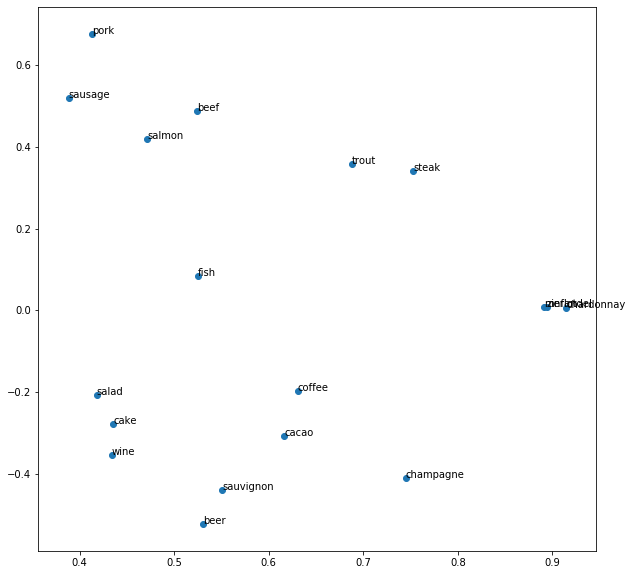

In [21]:
fig, ax = plt.subplots()
fig.set_size_inches((10, 10))
plot_vectors(test_vectors, test_words, how='svd', ax=ax)

## Обучение Word2Vec с помощью Gensim

In [24]:
import gensim

In [25]:
word2vec = gensim.models.Word2Vec(sentences=train_tokenized, size=100,
                                  window=5, min_count=5, workers=4,
                                  sg=1, iter=10)

In [27]:
word2vec.wv.most_similar('cheese')

[('salata', 0.8000380396842957),
 ('pecorino', 0.7668025493621826),
 ('gruyere', 0.7558684945106506),
 ('monterey', 0.7505999207496643),
 ('feta', 0.7481061816215515),
 ('gruyère', 0.7369630336761475),
 ('queso', 0.7337281703948975),
 ('jack', 0.7328696846961975),
 ('cheeses', 0.7317243814468384),
 ('cheddar', 0.7268048524856567)]

In [28]:
gensim_words = [w for w in test_words if w in word2vec.wv.vocab]
gensim_vectors = np.stack([word2vec.wv[w] for w in gensim_words])

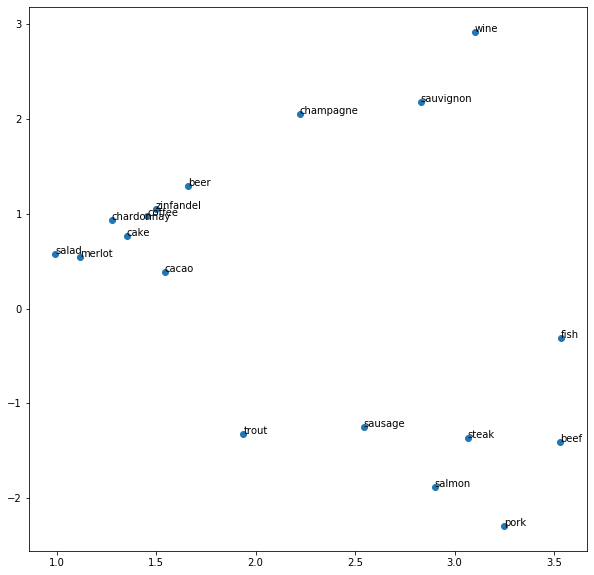

In [29]:
fig, ax = plt.subplots()
fig.set_size_inches((10, 10))
plot_vectors(gensim_vectors, test_words, how='svd', ax=ax)

## Загрузка предобученного Word2Vec

Источники готовых векторов:

https://rusvectores.org/ru/ - для русского языка

https://wikipedia2vec.github.io/wikipedia2vec/pretrained/ - много разных языков

In [30]:
import gensim.downloader as api

In [31]:
available_models = api.info()['models'].keys()
print('\n'.join(available_models))

fasttext-wiki-news-subwords-300
conceptnet-numberbatch-17-06-300
word2vec-ruscorpora-300
word2vec-google-news-300
glove-wiki-gigaword-50
glove-wiki-gigaword-100
glove-wiki-gigaword-200
glove-wiki-gigaword-300
glove-twitter-25
glove-twitter-50
glove-twitter-100
glove-twitter-200
__testing_word2vec-matrix-synopsis


In [32]:
pretrained = api.load('word2vec-google-news-300')  # > 1.5 GB!

[==================================================] 100.0% 1662.8/1662.8MB downloaded


In [35]:
pretrained.most_similar('cheese')

[('cheeses', 0.7789000272750854),
 ('cheddar', 0.7627596855163574),
 ('goat_cheese', 0.7297402620315552),
 ('Cheese', 0.7286962866783142),
 ('cheddar_cheese', 0.7255136966705322),
 ('Cheddar_cheese', 0.6943708658218384),
 ('mozzarella', 0.6805709600448608),
 ('cheddar_cheeses', 0.6694672703742981),
 ('Camembert', 0.6623163223266602),
 ('gruyere', 0.6615148186683655)]

In [36]:
pretrained.most_similar(positive=['man', 'queen'], negative=['king']) 
#какое слово относится к королеве, так же, как слово мужчина относится к слову король

[('woman', 0.7609435319900513),
 ('girl', 0.6139994263648987),
 ('teenage_girl', 0.6040961742401123),
 ('teenager', 0.5825759172439575),
 ('lady', 0.5752554535865784),
 ('boy', 0.5077576637268066),
 ('policewoman', 0.5066847801208496),
 ('schoolgirl', 0.5052095651626587),
 ('blonde', 0.48696184158325195),
 ('person', 0.48637545108795166)]

In [37]:
pretrained_words = [w for w in test_words if w in pretrained.vocab]
pretrained_vectors = np.stack([pretrained[w] for w in pretrained_words])

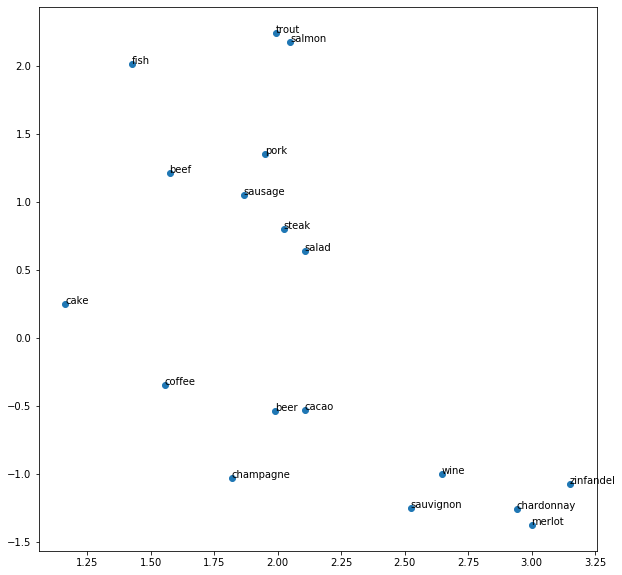

In [38]:
fig, ax = plt.subplots()
fig.set_size_inches((10, 10))
plot_vectors(pretrained_vectors, test_words, how='svd', ax=ax)

## Заключение

* Реализовали Skip Gram Negative Sampling на PyTorch
* Обучили на корпусе рецептов
    * Сходство слов модель выучила неплохо
    * Для аналогий мало данных
* Обучили SGNS с помощью библиотеки Gensim
* Загрузили веса Word2Vec, полученные с помощью большого корпуса (GoogleNews)
    * Списки похожих слов отличаются!
    * Аналогии работают

В качестве домашнего задания мы предлагаем Вам поэкспериментировать с кодом этого семинара, чтобы лучше понять свойства эмбеддингов и попробовать улучшить их качество. Что можно попробовать сделать:

поменять параметры - количеством отрицательных слов, размером батча, скоростью обучения, размером окна
убрать разбиение текстов на предложения и увеличить окно
изменить токенизацию, например, разобравшись с библиотекой SpaCy и подключив лемматизацию и POS-теггинг, чтобы строить эмбеддинги не для словоформ, а для лемм (например, chicked_NOUN)
реализовать FastText и сравнить, как отличаются списки похожих документов, получаемых с помощью Word2Vec и FastText
усложнить алгоритм оценки вероятности совместной встречаемости слов, например, заменив скалярное произведение на нейросеть с парой слоёв


# Задачи

# 1. Word2Vec Skip Gram Negative Sampling выбор обучающих примеров

In [21]:
#используется только целый токен
n = window_size // 2
ln = len(text)
res = []
    
for i in range(ln):
    pos = [[text[i], text[j], 1] for j in range(i+1, min(i+n+1, ln))] + \
            [[text[i], text[j], 1] for j in range(max(i-n, 0), i)]
    neg = [[text[i], j, 0] for j in np.random.choice(vocab_size, ns_rate*len(pos))]
    res += pos + neg

# 2. Word2Vec Skip Gram Negative Sampling. обновление весов

In [41]:
#используется только целый токен
import numpy as np
label = 0

w = np.array([0.9836099232994968, 0.3847689688960674, 0.033312247867206435])
d = np.array([0.882545488649187, 0.6223076699449618, 0.1633041302523962])

sig = 1/(1+np.exp(-sum(w*d)))
learning_rate = 0.342405260598321

w_updated = w - d*(sig - label)*learning_rate #перекрещивается с контекстным словом из-за того, что производная по w
d_updated = d - w*(sig - label)*learning_rate #перекрещивается с центральным словом из-за того, что производная по d

# 3. FastText SkipGram Negative Sampling выбор обучающих примеров

In [ ]:
#используются н-граммы
text = list(text)
token2subwords = list(token2subwords)
examples_list = []
    
for i in range(len(text)):
    left_border = i-(window_size-1)//2
    right_border = i+1+(window_size-1)//2
    z = i+1
    masked_text = text[max(left_border,0):i] + text[z:min(len(text),right_border)]
    for i_1 in range(len(masked_text)):
        examples_list.append(([text[i]] + token2subwords[text[i]], masked_text[i_1], 1))
        for _ in range(ns_rate):
            examples_list.append(([text[i]] + token2subwords[text[i]], np.random.randint(vocab_size), 0))
return examples_list

# 4. FastText SkipGram Negative Sampling 3. обновление весов

In [192]:
#используются н-граммы
W = center_embeddings[center_subwords]
D =context_embeddings[context_word]
sig = 1/(1+np.exp(-np.sum((sum(W)/len(W))*D)))
W_updated = W - D*(sig - label)*learning_rate/len(W)
D_updated = D - W*(sig - label)*learning_rate
center_embeddings[center_subwords] = W_updated
context_embeddings[context_word] = sum(D_updated)/len(D_updated)

# 5.  GloVe матрица частотности

In [115]:
import numpy as np
import scipy.sparse

texts = [[0, 2, 2, 2, 0, 0], 
        [1, 1, 2, 1, 1], 
        [2, 2, 1, 1]]
vocab_size = 3
weight_matrix_1 = []
weight_matrix_2 = []

[[sum([word_1 in text and word_2 in text for text in texts if word_1 != word_2])
                                     for word_1 in range(vocab_size)] for word_2 in range(vocab_size)]

[[0, 0, 1], [0, 0, 2], [1, 2, 0]]

# 6. GloVe обновление весов

In [269]:
alpha = 0.5878728651551414
learning_rate = 0.8066056621137515
max_x=97
F = (x/max_x)**alpha 
F[F>1] = 1.0

der_w_part = np.matmul(w, d.T) - np.log(x+1)
der_d_part = np.matmul(w, d.T) - np.log(x+1)

glove_loss_der_w = np.matmul(np.multiply(F*2, der_w_part), d)
glove_loss_der_d = np.matmul(np.multiply(F*2, der_d_part).T, w)
    
w_updated = w - learning_rate*glove_loss_der_w
d_updated = d - learning_rate*glove_loss_der_d

# 7. Найти наиболее похожие слова

In [325]:
emb = (embeddings.T / np.linalg.norm(embeddings, axis=1)).T
a = emb[query_word_id]
sim = -np.sqrt(np.sum((np.square(a-emb)),axis=1) )
sim = [(k,v) for k,v in enumerate(sim)]
return sorted(sim, key=lambda x : x[1],  reverse=True)[:get_n]

rating = sim(embeddings_norm, embeddings_norm[query_word_id])
positions = np.argsort(rating)[::-1][:get_n]

# 1.7 Основные виды блоков нейросетевых моделей

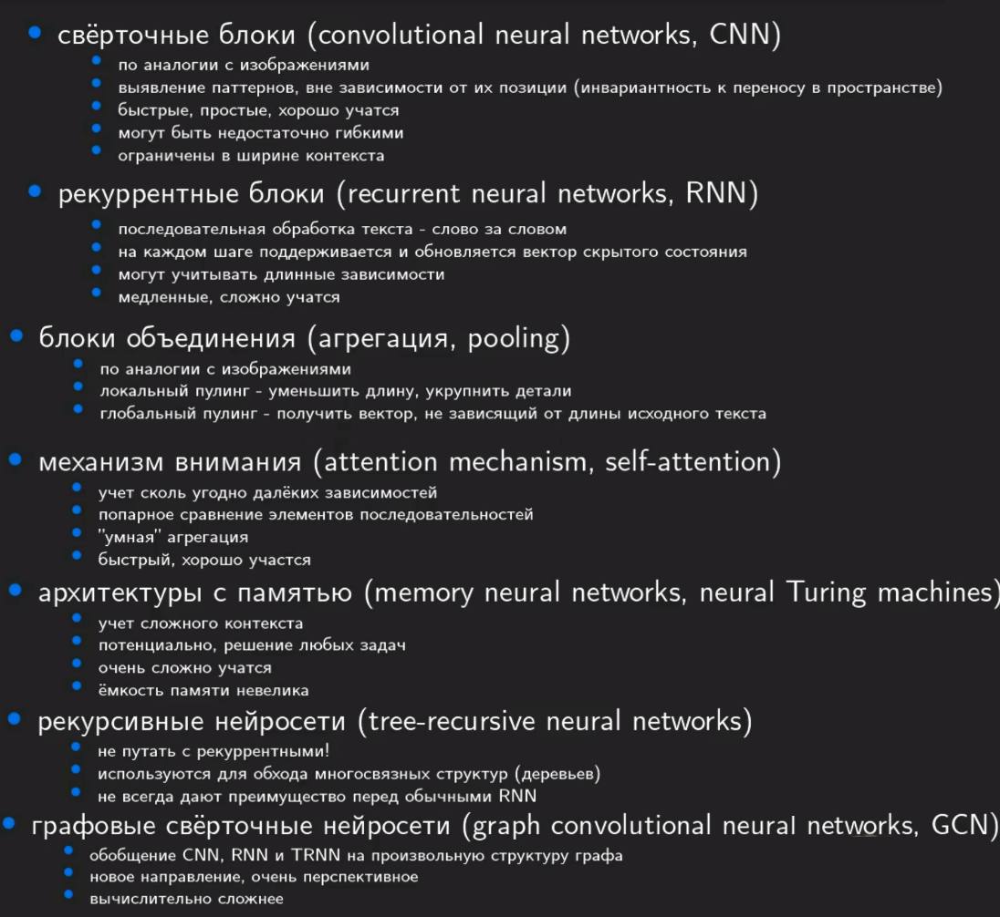

In [3]:
#Блоки нейросетей
from IPython.display import Image #display picture
Image('Untitled35.png')

# 1.8 Сверточные нейронные сети

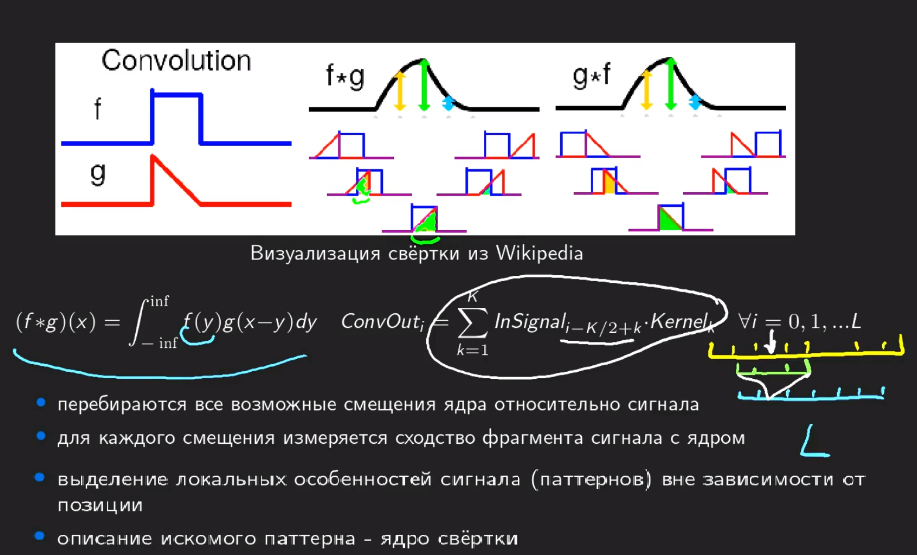

In [5]:
#Свертки
Image('untitled36.png')

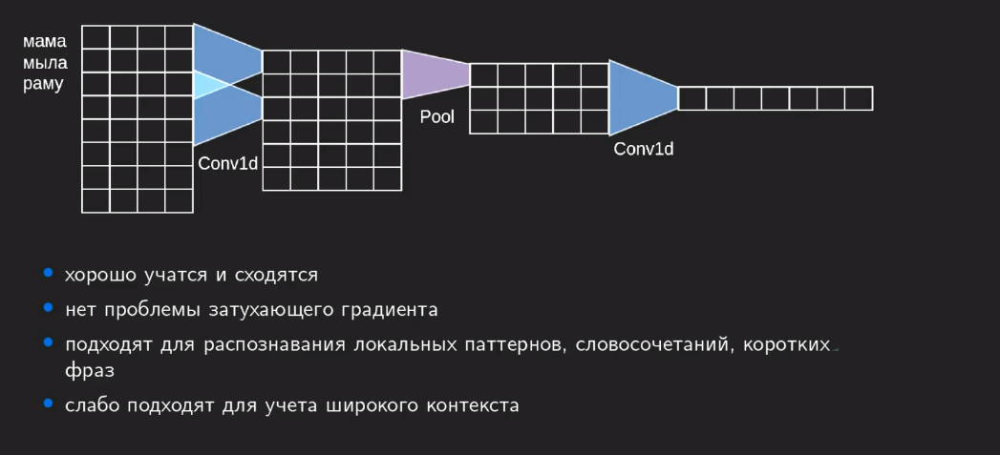

In [18]:
Image('Untitled37.png')

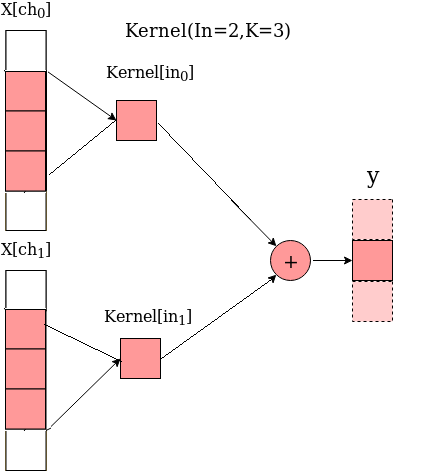

In [13]:
#Двухканальная свертка 
Image('Untitled1 (2).png')

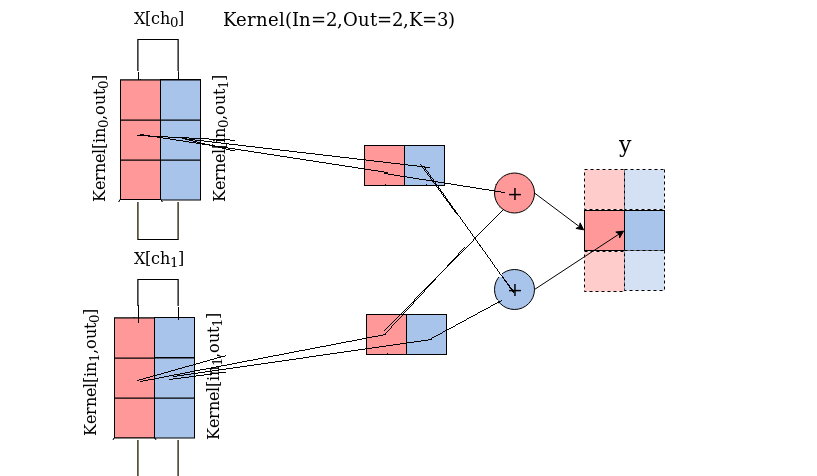

In [16]:
#Свертка с двумя входными и двумя выходными каналами (2,2,3)
Image('Untitled38.png')

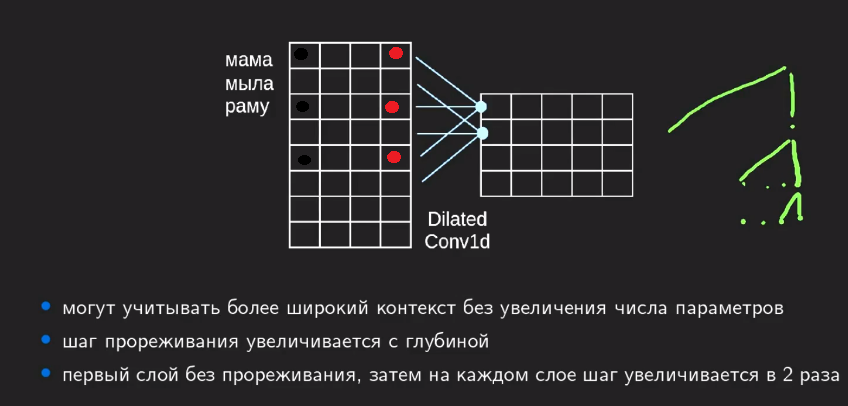

In [20]:
#Разреженная свертка
Image('Untitled39.png')

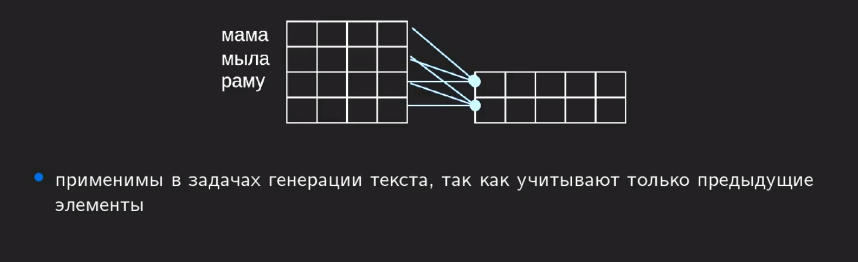

In [21]:
#Авторегрессия использует только предыдущие слова (применяется для генерация текста)
Image('Untitled40.png')

# 1.9 Свёрточные нейросети и POS-теггинг

POS-теггинг - определение частей речи (снятие частеречной неоднозначности)

In [1]:
# Если Вы запускаете ноутбук на colab или kaggle,
# выполните следующие строчки, чтобы подгрузить библиотеку dlnlputils:

# !git clone https://github.com/Samsung-IT-Academy/stepik-dl-nlp.git && pip install -r stepik-dl-nlp/requirements.txt
# import sys; sys.path.append('./stepik-dl-nlp')

In [2]:
#!pip install pyconll
#!pip install spacy_udpipe

In [3]:
%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings('ignore')

from sklearn.metrics import classification_report

import numpy as np

import pyconll

import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import TensorDataset

import dlnlputils
from dlnlputils.data import tokenize_corpus, build_vocabulary, \
    character_tokenize, pos_corpus_to_tensor, POSTagger
from dlnlputils.pipeline import train_eval_loop, predict_with_model, init_random_seed

init_random_seed()

## Загрузка текстов и разбиение на обучающую и тестовую подвыборки

In [4]:
# Если Вы запускаете ноутбук на colab или kaggle, добавьте в начало пути ./stepik-dl-nlp
import urllib.request

url1 = 'https://raw.githubusercontent.com/UniversalDependencies/UD_Russian-SynTagRus/master/ru_syntagrus-ud-train.conllu'
url2 = 'https://raw.githubusercontent.com/UniversalDependencies/UD_Russian-SynTagRus/master/ru_syntagrus-ud-dev.conllu'

filename1 = './datasets/ru_syntagrus-ud-train.conllu'
filename2 = './datasets/ru_syntagrus-ud-dev.conllu'


urllib.request.urlretrieve(url1, filename1)
urllib.request.urlretrieve(url2, filename2)

('./datasets/ru_syntagrus-ud-dev.conllu',
 <http.client.HTTPMessage at 0x14416048>)

In [5]:
# Если Вы запускаете ноутбук на colab или kaggle, добавьте в начало пути ./stepik-dl-nlp
full_train = pyconll.load_from_file('./datasets/ru_syntagrus-ud-train.conllu')
full_test = pyconll.load_from_file('./datasets/ru_syntagrus-ud-dev.conllu')

In [6]:
for sent in full_train[:2]:
    for token in sent:
        print(token.form, token.upos)
    print()

Анкета NOUN
. PUNCT

Начальник NOUN
областного ADJ
управления NOUN
связи NOUN
Семен PROPN
Еремеевич PROPN
был AUX
человек NOUN
простой ADJ
, PUNCT
приходил VERB
на ADP
работу NOUN
всегда ADV
вовремя ADV
, PUNCT
здоровался VERB
с ADP
секретаршей NOUN
за ADP
руку NOUN
и CCONJ
иногда ADV
даже PART
писал VERB
в ADP
стенгазету NOUN
заметки NOUN
под ADP
псевдонимом NOUN
" PUNCT
Муха NOUN
" PUNCT
. PUNCT



In [7]:
MAX_SENT_LEN = max(len(sent) for sent in full_train)
MAX_ORIG_TOKEN_LEN = max(len(token.form) for sent in full_train for token in sent)
print('Наибольшая длина предложения', MAX_SENT_LEN)
print('Наибольшая длина токена', MAX_ORIG_TOKEN_LEN)

Наибольшая длина предложения 205
Наибольшая длина токена 47


In [8]:
all_train_texts = [' '.join(token.form for token in sent) for sent in full_train]
print('\n'.join(all_train_texts[:10]))

Анкета .
Начальник областного управления связи Семен Еремеевич был человек простой , приходил на работу всегда вовремя , здоровался с секретаршей за руку и иногда даже писал в стенгазету заметки под псевдонимом " Муха " .
В приемной его с утра ожидали посетители , - кое-кто с важными делами , а кое-кто и с такими , которые легко можно было решить в нижестоящих инстанциях , не затрудняя Семена Еремеевича .
Однако стиль работы Семена Еремеевича заключался в том , чтобы принимать всех желающих и лично вникать в дело .
Приемная была обставлена просто , но по-деловому .
У двери стоял стол секретарши , на столе - пишущая машинка с широкой кареткой .
В углу висел репродуктор и играло радио для развлечения ожидающих и еще для того , чтобы заглушать голос начальника , доносившийся из кабинета , так как , бесспорно , среди посетителей могли находиться и случайные люди .
Кабинет отличался скромностью , присущей Семену Еремеевичу .
В глубине стоял широкий письменный стол с бронзовыми чернильницами

In [9]:
train_char_tokenized = tokenize_corpus(all_train_texts, tokenizer=character_tokenize)
char_vocab, word_doc_freq = build_vocabulary(train_char_tokenized, max_doc_freq=1.0, min_count=5, pad_word='<PAD>')
print("Количество уникальных символов", len(char_vocab))
print(list(char_vocab.items())[:10])

Количество уникальных символов 150
[('<PAD>', 0), (' ', 1), ('о', 2), ('е', 3), ('а', 4), ('т', 5), ('и', 6), ('н', 7), ('.', 8), ('с', 9)]


In [10]:
UNIQUE_TAGS = ['<NOTAG>'] + sorted({token.upos for sent in full_train for token in sent if token.upos})
label2id = {label: i for i, label in enumerate(UNIQUE_TAGS)}
label2id

{'<NOTAG>': 0,
 'ADJ': 1,
 'ADP': 2,
 'ADV': 3,
 'AUX': 4,
 'CCONJ': 5,
 'DET': 6,
 'INTJ': 7,
 'NOUN': 8,
 'NUM': 9,
 'PART': 10,
 'PRON': 11,
 'PROPN': 12,
 'PUNCT': 13,
 'SCONJ': 14,
 'SYM': 15,
 'VERB': 16,
 'X': 17}

In [11]:
train_inputs, train_labels = pos_corpus_to_tensor(full_train, char_vocab, label2id, MAX_SENT_LEN, MAX_ORIG_TOKEN_LEN)
train_dataset = TensorDataset(train_inputs, train_labels)

test_inputs, test_labels = pos_corpus_to_tensor(full_test, char_vocab, label2id, MAX_SENT_LEN, MAX_ORIG_TOKEN_LEN)
test_dataset = TensorDataset(test_inputs, test_labels)

In [12]:
train_inputs[1][:5]

tensor([[ 0, 39,  4, 25,  4, 11, 20,  7,  6, 13,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 0,  2, 23, 11,  4,  9,  5,  7,  2, 22,  2,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 0, 17, 16, 10,  4, 12, 11,  3,  7,  6, 19,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 0,  9, 12, 19, 21,  6,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
        [ 0, 40,  3, 15,  3,  7,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
          0,  0,  0,  0

In [13]:
train_labels[1]

tensor([ 8,  1,  8,  8, 12, 12,  4,  8,  1, 13, 16,  2,  8,  3,  3, 13, 16,  2,
         8,  2,  8,  5,  3, 10, 16,  2,  8,  8,  2,  8, 13,  8, 13, 13,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0])

## Вспомогательная свёрточная архитектура

In [14]:
class StackedConv1d(nn.Module):
    def __init__(self, features_num, layers_n=1, kernel_size=3, conv_layer=nn.Conv1d, dropout=0.0):
        super().__init__()
        layers = []
        for _ in range(layers_n):
            layers.append(nn.Sequential(
                conv_layer(features_num, features_num, kernel_size, padding=kernel_size//2),
                nn.Dropout(dropout),                   #предотвращает переобучение, зануляя случайные ячейки тензора
                nn.LeakyReLU()))
        self.layers = nn.ModuleList(layers)
    
    def forward(self, x):
        """x - BatchSize x FeaturesNum x SequenceLen"""
        for layer in self.layers:
            x = x + layer(x)
        return x

## Предсказание частей речи на уровне отдельных токенов

In [15]:
#Смысл в том, чтобы посмотреть все возможные н-граммы в токене, и по ним определить часть речи

class SingleTokenPOSTagger(nn.Module):
    def __init__(self, vocab_size, labels_num, embedding_size=32, **kwargs):
        super().__init__()
        self.char_embeddings = nn.Embedding(vocab_size, embedding_size, padding_idx=0)
        self.backbone = StackedConv1d(embedding_size, **kwargs)
        self.global_pooling = nn.AdaptiveMaxPool1d(1)
        self.out = nn.Linear(embedding_size, labels_num)
        self.labels_num = labels_num
    
    def forward(self, tokens):
        """tokens - BatchSize x MaxSentenceLen x MaxTokenLen"""
        batch_size, max_sent_len, max_token_len = tokens.shape
        tokens_flat = tokens.view(batch_size * max_sent_len, max_token_len)
        
        char_embeddings = self.char_embeddings(tokens_flat)  # BatchSize*MaxSentenceLen x MaxTokenLen x EmbSize
        char_embeddings = char_embeddings.permute(0, 2, 1)  # BatchSize*MaxSentenceLen x EmbSize x MaxTokenLen
        
        features = self.backbone(char_embeddings)
        
        global_features = self.global_pooling(features).squeeze(-1)  # BatchSize*MaxSentenceLen x EmbSize
        
        logits_flat = self.out(global_features)  # BatchSize*MaxSentenceLen x LabelsNum
        logits = logits_flat.view(batch_size, max_sent_len, self.labels_num)  # BatchSize x MaxSentenceLen x LabelsNum
        logits = logits.permute(0, 2, 1)  # BatchSize x LabelsNum x MaxSentenceLen
        return logits

In [16]:
single_token_model = SingleTokenPOSTagger(len(char_vocab), len(label2id), embedding_size=64, layers_n=3, kernel_size=3, dropout=0.3)
print('Количество параметров', sum(np.product(t.shape) for t in single_token_model.parameters()))

Количество параметров 47826


In [ ]:
(best_val_loss,
 best_single_token_model) = train_eval_loop(single_token_model,
                                            train_dataset,
                                            test_dataset,
                                            F.cross_entropy,
                                            lr=5e-3,
                                            epoch_n=5,
                                            batch_size=64,
                                            device='cuda',
                                            early_stopping_patience=5,
                                            max_batches_per_epoch_train=500,
                                            max_batches_per_epoch_val=100,
                                            lr_scheduler_ctor=lambda optim: torch.optim.lr_scheduler.ReduceLROnPlateau(optim, patience=2,
                                                                                                                       factor=0.5,
                                                                                                                       verbose=True))

Эпоха 0


In [ ]:
# Если Вы запускаете ноутбук на colab или kaggle, добавьте в начало пути ./stepik-dl-nlp
torch.save(best_single_token_model.state_dict(), './models/single_token_pos.pth')

In [ ]:
# Если Вы запускаете ноутбук на colab или kaggle, добавьте в начало пути ./stepik-dl-nlp
single_token_model.load_state_dict(torch.load('./models/single_token_pos.pth'))

In [ ]:
train_pred = predict_with_model(single_token_model, train_dataset)
train_loss = F.cross_entropy(torch.tensor(train_pred),
                             torch.tensor(train_labels))
print('Среднее значение функции потерь на обучении', float(train_loss))
print(classification_report(train_labels.view(-1), train_pred.argmax(1).reshape(-1), target_names=UNIQUE_TAGS))
print()

test_pred = predict_with_model(single_token_model, test_dataset)
test_loss = F.cross_entropy(torch.tensor(test_pred),
                            torch.tensor(test_labels))
print('Среднее значение функции потерь на валидации', float(test_loss))
print(classification_report(test_labels.view(-1), test_pred.argmax(1).reshape(-1), target_names=UNIQUE_TAGS))

## Предсказание частей речи на уровне предложений (с учётом контекста)

In [ ]:
class SentenceLevelPOSTagger(nn.Module):
    def __init__(self, vocab_size, labels_num, embedding_size=32, single_backbone_kwargs={}, context_backbone_kwargs={}):
        super().__init__()
        self.embedding_size = embedding_size
        self.char_embeddings = nn.Embedding(vocab_size, embedding_size, padding_idx=0)
        self.single_token_backbone = StackedConv1d(embedding_size, **single_backbone_kwargs)
        self.context_backbone = StackedConv1d(embedding_size, **context_backbone_kwargs)
        self.global_pooling = nn.AdaptiveMaxPool1d(1)
        self.out = nn.Conv1d(embedding_size, labels_num, 1)
        self.labels_num = labels_num
    
    def forward(self, tokens):
        """tokens - BatchSize x MaxSentenceLen x MaxTokenLen"""
        batch_size, max_sent_len, max_token_len = tokens.shape
        tokens_flat = tokens.view(batch_size * max_sent_len, max_token_len)
        
        char_embeddings = self.char_embeddings(tokens_flat)  # BatchSize*MaxSentenceLen x MaxTokenLen x EmbSize
        char_embeddings = char_embeddings.permute(0, 2, 1)  # BatchSize*MaxSentenceLen x EmbSize x MaxTokenLen
        char_features = self.single_token_backbone(char_embeddings)
        
        token_features_flat = self.global_pooling(char_features).squeeze(-1)  # BatchSize*MaxSentenceLen x EmbSize

        token_features = token_features_flat.view(batch_size, max_sent_len, self.embedding_size)  # BatchSize x MaxSentenceLen x EmbSize
        token_features = token_features.permute(0, 2, 1)  # BatchSize x EmbSize x MaxSentenceLen
        context_features = self.context_backbone(token_features)  # BatchSize x EmbSize x MaxSentenceLen

        logits = self.out(context_features)  # BatchSize x LabelsNum x MaxSentenceLen
        return logits

In [ ]:
sentence_level_model = SentenceLevelPOSTagger(len(char_vocab), len(label2id), embedding_size=64,
                                              single_backbone_kwargs=dict(layers_n=3, kernel_size=3, dropout=0.3),
                                              context_backbone_kwargs=dict(layers_n=3, kernel_size=3, dropout=0.3))
print('Количество параметров', sum(np.product(t.shape) for t in sentence_level_model.parameters()))

In [ ]:
(best_val_loss,
 best_sentence_level_model) = train_eval_loop(sentence_level_model,
                                              train_dataset,
                                              test_dataset,
                                              F.cross_entropy,
                                              lr=5e-3,
                                              epoch_n=5,
                                              batch_size=64,
                                              device='cuda',
                                              early_stopping_patience=5,
                                              max_batches_per_epoch_train=500,
                                              max_batches_per_epoch_val=100,
                                              lr_scheduler_ctor=lambda optim: torch.optim.lr_scheduler.ReduceLROnPlateau(optim, patience=2,
                                                                                                                         factor=0.5,
                                                                                                                         verbose=True))

In [ ]:
# Если Вы запускаете ноутбук на colab или kaggle, добавьте в начало пути ./stepik-dl-nlp
torch.save(best_sentence_level_model.state_dict(), './models/sentence_level_pos.pth')

In [ ]:
# Если Вы запускаете ноутбук на colab или kaggle, добавьте в начало пути ./stepik-dl-nlp
sentence_level_model.load_state_dict(torch.load('./models/sentence_level_pos.pth'))

In [ ]:
train_pred = predict_with_model(sentence_level_model, train_dataset)
train_loss = F.cross_entropy(torch.tensor(train_pred),
                             torch.tensor(train_labels))
print('Среднее значение функции потерь на обучении', float(train_loss))
print(classification_report(train_labels.view(-1), train_pred.argmax(1).reshape(-1), target_names=UNIQUE_TAGS))
print()

test_pred = predict_with_model(sentence_level_model, test_dataset)
test_loss = F.cross_entropy(torch.tensor(test_pred),
                            torch.tensor(test_labels))
print('Среднее значение функции потерь на валидации', float(test_loss))
print(classification_report(test_labels.view(-1), test_pred.argmax(1).reshape(-1), target_names=UNIQUE_TAGS))

## Применение полученных теггеров и сравнение

In [ ]:
single_token_pos_tagger = POSTagger(single_token_model, char_vocab, UNIQUE_TAGS, MAX_SENT_LEN, MAX_ORIG_TOKEN_LEN)
sentence_level_pos_tagger = POSTagger(sentence_level_model, char_vocab, UNIQUE_TAGS, MAX_SENT_LEN, MAX_ORIG_TOKEN_LEN)

In [ ]:
test_sentences = [
    'Мама мыла раму.',
    'Косил косой косой косой.',
    'Глокая куздра штеко будланула бокра и куздрячит бокрёнка.',
    'Сяпала Калуша с Калушатами по напушке.',
    'Пирожки поставлены в печь, мама любит печь.',
    'Ведро дало течь, вода стала течь.',
    'Три да три, будет дырка.',
    'Три да три, будет шесть.',
    'Сорок сорок'
]
test_sentences_tokenized = tokenize_corpus(test_sentences, min_token_size=1)

In [ ]:
for sent_tokens, sent_tags in zip(test_sentences_tokenized, single_token_pos_tagger(test_sentences)):
    print(' '.join('{}-{}'.format(tok, tag) for tok, tag in zip(sent_tokens, sent_tags)))
    print()

In [ ]:
for sent_tokens, sent_tags in zip(test_sentences_tokenized, sentence_level_pos_tagger(test_sentences)):
    print(' '.join('{}-{}'.format(tok, tag) for tok, tag in zip(sent_tokens, sent_tags)))
    print()

## Свёрточный модуль своими руками

In [ ]:
class MyConv1d(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, padding=0):
        super().__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.kernel_size = kernel_size
        self.padding = padding
        self.weight = nn.Parameter(torch.randn(in_channels * kernel_size, out_channels) / (in_channels * kernel_size),
                                   requires_grad=True)
        self.bias = nn.Parameter(torch.zeros(out_channels), requires_grad=True)
    
    def forward(self, x):
        """x - BatchSize x InChannels x SequenceLen"""

        batch_size, src_channels, sequence_len = x.shape        
        if self.padding > 0:
            pad = x.new_zeros(batch_size, src_channels, self.padding)
            x = torch.cat((pad, x, pad), dim=-1)
            sequence_len = x.shape[-1]

        chunks = []
        chunk_size = sequence_len - self.kernel_size + 1
        for offset in range(self.kernel_size):
            chunks.append(x[:, :, offset:offset + chunk_size])

        in_features = torch.cat(chunks, dim=1)  # BatchSize x InChannels * KernelSize x ChunkSize
        in_features = in_features.permute(0, 2, 1)  # BatchSize x ChunkSize x InChannels * KernelSize
        out_features = torch.bmm(in_features, self.weight.unsqueeze(0).expand(batch_size, -1, -1)) + self.bias.unsqueeze(0).unsqueeze(0)
        out_features = out_features.permute(0, 2, 1)  # BatchSize x OutChannels x ChunkSize
        return out_features

In [ ]:
sentence_level_model_my_conv = SentenceLevelPOSTagger(len(char_vocab), len(label2id), embedding_size=64,
                                                      single_backbone_kwargs=dict(layers_n=3, kernel_size=3, dropout=0.3, conv_layer=MyConv1d),
                                                      context_backbone_kwargs=dict(layers_n=3, kernel_size=3, dropout=0.3, conv_layer=MyConv1d))
print('Количество параметров', sum(np.product(t.shape) for t in sentence_level_model_my_conv.parameters()))

In [ ]:
(best_val_loss,
 best_sentence_level_model_my_conv) = train_eval_loop(sentence_level_model_my_conv,
                                                      train_dataset,
                                                      test_dataset,
                                                      F.cross_entropy,
                                                      lr=5e-3,
                                                      epoch_n=5,
                                                      batch_size=64,
                                                      device='cuda',
                                                      early_stopping_patience=5,
                                                      max_batches_per_epoch_train=500,
                                                      max_batches_per_epoch_val=100,
                                                      lr_scheduler_ctor=lambda optim: torch.optim.lr_scheduler.ReduceLROnPlateau(optim, patience=2,
                                                                                                                                 factor=0.5,
                                                                                                                                 verbose=True))

In [ ]:
train_pred = predict_with_model(best_sentence_level_model_my_conv, train_dataset)
train_loss = F.cross_entropy(torch.tensor(train_pred),
                             torch.tensor(train_labels))
print('Среднее значение функции потерь на обучении', float(train_loss))
print(classification_report(train_labels.view(-1), train_pred.argmax(1).reshape(-1), target_names=UNIQUE_TAGS))
print()

test_pred = predict_with_model(best_sentence_level_model_my_conv, test_dataset)
test_loss = F.cross_entropy(torch.tensor(test_pred),
                            torch.tensor(test_labels))
print('Среднее значение функции потерь на валидации', float(test_loss))
print(classification_report(test_labels.view(-1), test_pred.argmax(1).reshape(-1), target_names=UNIQUE_TAGS))

# Задача 1 обработка входных данных сверткой

In [2]:
import numpy as np
#дата входящих каналов 2, длина 16
data = np.array([[0.6685863697825855, 0.9865099796400376], 
                [0.32297881307708, 0.9908870158650515], 
                [0.8359169063921157, 0.5443776713017927], 
                [0.5363888029267118, 0.34755850459471804], 
                [0.5966372342560426, 0.9834742307894673], 
                [0.7371274295314912, 0.03279590013405109], 
                [0.08580648148402137, 0.2850655085982621], 
                [0.584942134340805, 0.7981720699451806], 
                [0.19604496972304086, 0.991819073359733], 
                [0.5622511488322055, 0.07928952553499002], 
                [0.24152151330089744, 0.2865696384305756], 
                [0.882594506643994, 0.5949729821472712], 
                [0.10820233432771786, 0.8549971123651271], 
                [0.18754460128195194, 0.6303661925298489], 
                [0.3551051497971416, 0.9452980688158904], 
                [0.6525044770663634, 0.8054232618991838]])
#свертка с входящих исходящих каналов 3 входящих каналов 2, , ядро 5 (3х2х5)
kernel = np.array([[[0.8638059436915633, 0.4002290439648929, 0.8174398057982054, 0.34082478315585973, 0.5565832130592809], 
                    [0.08497737591188492, 0.7853885140384725, 0.1645895575029136, 0.6294907704137637, 0.8169862258229014]], 
                   [[0.21527072709338957, 0.9185427760457524, 0.5167378860756242, 0.12177789993763499, 0.4201289643444214], 
                    [0.8389450071463863, 0.6238637143288427, 0.5098771768082815, 0.1436853463091461, 0.12036561608743845]], 
                   [[0.8347050184618267, 0.12339875692133984, 0.13629086964943626, 0.623950910768403, 0.7092189295761365], 
                    [0.9578703072530402, 0.31612669923975534, 0.44018179806384916, 0.26615330385390035, 0.2745979551030847]]])

bias = np.array([0.6574440445518804, 0.3253787051567585, 0.3119672663686287])
#Обработка слоя сверткой
window_size = len(kernel[0][0])
out_size = len(data)-window_size+1
out = [[sum(np.diag(np.matmul(kern, data[i:i+window_size,]))) for kern in kernel] for i in range(out_size)]
out + bias #длина 14, и 3 выходных канала

array([[4.53637401, 3.40559783, 3.64203285],
       [3.53791755, 3.31563793, 3.19785548],
       [3.11553433, 2.6461514 , 2.82923446],
       [3.95582621, 2.68487692, 2.35547493],
       [3.31545625, 2.55379287, 2.97932928],
       [3.23359714, 1.88961059, 2.29726403],
       [2.55036376, 2.44108517, 2.06635398],
       [3.80066148, 2.76372775, 3.03033055],
       [2.87705358, 2.37783992, 2.69971685],
       [3.48545989, 1.96369042, 1.96099252],
       [3.37079171, 2.66791052, 2.27237898],
       [4.17954021, 2.6157867 , 3.36235457]])

# Задача 2 производная по kernel dy/dk 

In [63]:
import numpy as np
#Входные данные, 3 входных канала на 9
x = np.array([[0.1559846921787793, 0.31890243279158936, 0.4294841981370352], 
              [0.6287087193276831, 0.041166388481120975, 0.0670771539905104], 
              [0.15852860049868056, 0.5535509628878403, 0.7578893631796608], 
              [0.505354018460584, 0.39104507392557886, 0.267830936523598], 
              [0.35352084058390487, 0.09557605719492113, 0.17762289879326898], 
              [0.17895124947325458, 0.2038143268404633, 0.45431038892117714], 
              [0.44910520386366004, 0.28874952266426823, 0.48880576852948343], 
              [0.978917156152191, 0.11927306276379035, 0.6831784491543058], 
              [0.7665547409895508, 0.02661305420346527, 0.662020788170643]])
#Выходные данные после обработки свертки с ядром 3
y = np.array([[0.9423069699375323, 2.235723993887441], 
     [1.051430354504024, 2.5441990558270864], 
     [1.3060781439427196, 2.77617352972661], 
     [1.1097986223660692, 2.019161891632857], 
     [0.8312656308401454, 2.1968468090151005], 
     [1.0883546513743934, 3.182136137325698], 
     [1.4545203460970286, 3.3294233853738975]])

#Свертка на 2 выходных канала, 3 входных канала, ядро 3
kernel = np.array([[[0.7285150274194675, 0.13990616439149894, 0.08385531710791316], 
                    [0.8119118106104425, 0.19272155988045991, 0.010762309371285528], 
                    [0.5242309485683324, 0.33106798748722055, 0.2219888201243384]], 
                   [[0.31261137319823096, 0.3951341806652614, 0.954412244770657], 
                    [0.5475239344122861, 0.6407966544293683, 0.2840031545245296], 
                    [0.9267337670407934, 0.626334029479077, 0.4315268897320006]]])

window_size = len(kernel[0][0])
out_size = len(x)-window_size+1
out = np.array([sum([x[i:i+window_size,].T for i in range(out_size)]) for k in kernel])
out

array([[[2.43015332, 3.25308579, 3.39093181],
        [1.89280476, 1.69317539, 1.67862206],
        [2.64302071, 2.89671496, 3.49165859]],

       [[2.43015332, 3.25308579, 3.39093181],
        [1.89280476, 1.69317539, 1.67862206],
        [2.64302071, 2.89671496, 3.49165859]]])

# Задача 3 производная по x

In [61]:
import numpy as np
#входные данные 2 входных канала, длина 8
x = np.array([[0.5031766517322117, 0.30744410216949514], 
              [0.04690208449415345, 0.322727131626243], 
              [0.1388690574185909, 0.48576543724022325], 
              [0.5260018011862109, 0.5859221562109312], 
              [0.9194272143904142, 0.3887293155713266], 
              [0.26873714217871125, 0.9546207791313607], 
              [0.8974007607375208, 0.5713329992292489], 
              [0.378989716528242, 0.49787928388753266]])

#выходные данные 3 выходных канала длина 6
y = np.array([[1.5157583762374225, 0.9460413662192456, 0.9802340338281511], 
              [1.5728362445918327, 0.996409724139607, 1.2530013664472253], 
              [1.9068174476481374, 1.430592927945995, 1.6704630594015581], 
              [2.189768979209843, 2.3149543871163503, 2.1601629609824995], 
              [2.8353457102707083, 1.7422359297539565, 1.816707087141475], 
              [2.0532913525958474, 1.9924093441385802, 2.3069493556139014]])

#свертка 3 выходных канала, 2 входных, ядро 3
kernel = np.array([[[0.8077620147648772, 0.006392942850116379, 0.6080212915877307], 
                    [0.6288229869798402, 0.6410664904844843, 0.75419330562945]], 
                   [[0.5355186530459589, 0.9211024178840701, 0.27725553497982014], 
                    [0.4507098181629161, 0.081570594016668, 0.8234980185346139]], 
                   [[0.0325944131753374, 0.7744753133142763, 0.05946983249285043], 
                    [0.7059580971549311, 0.7969953841197822, 0.5257810951530107]]])

bias = np.array([0.2579976950685653, 0.029957050945287222, 0.18958928880952108])
window_size = len(kernel[0][0])
out_size = len(x)-window_size+1
out = np.zeros(x.shape)
for i in range(out_size):
    for k in kernel:
        out[i:i+3,]+=k.T 
out

array([[1.37587508, 1.7854909 ],
       [3.07784576, 3.30512337],
       [4.02259241, 5.40859579],
       [4.02259241, 5.40859579],
       [4.02259241, 5.40859579],
       [4.02259241, 5.40859579],
       [2.64671733, 3.62310489],
       [0.94474666, 2.10347242]])

# Задача 4 расчет рецептивного поля

In [28]:
import numpy as np

layers = np.array([[9, 2],
                    [9, 3],
                      [3, 4]])
receptive_field = 0
for i in range(len(layers)):
     receptive_field += layers[i][1]*(layers[i][0]//2)
receptive_field *= 2
receptive_field +=1
receptive_field

49

# 1.10  Рекуррентные нейросети

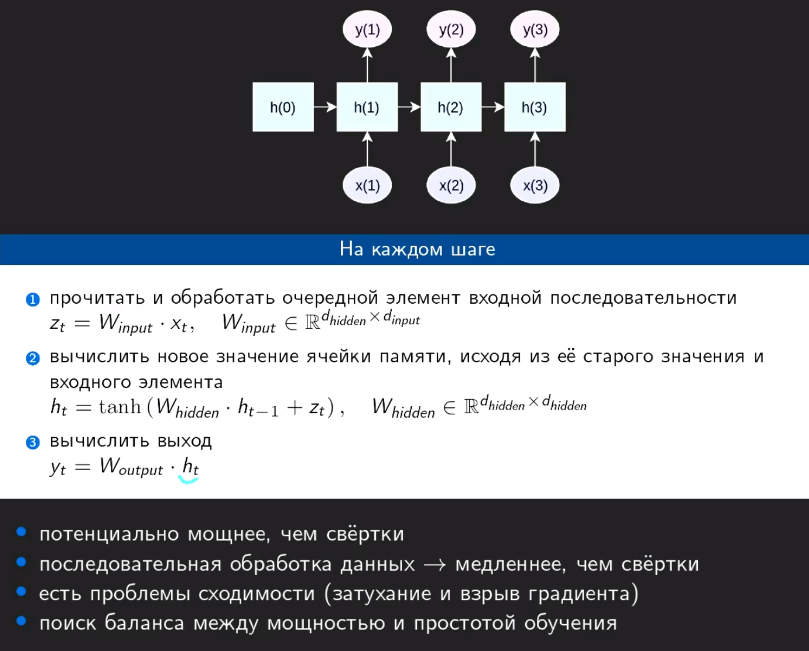

In [3]:
#Основной принцип
from IPython.display import Image #display picture
Image('Untitled41.png')

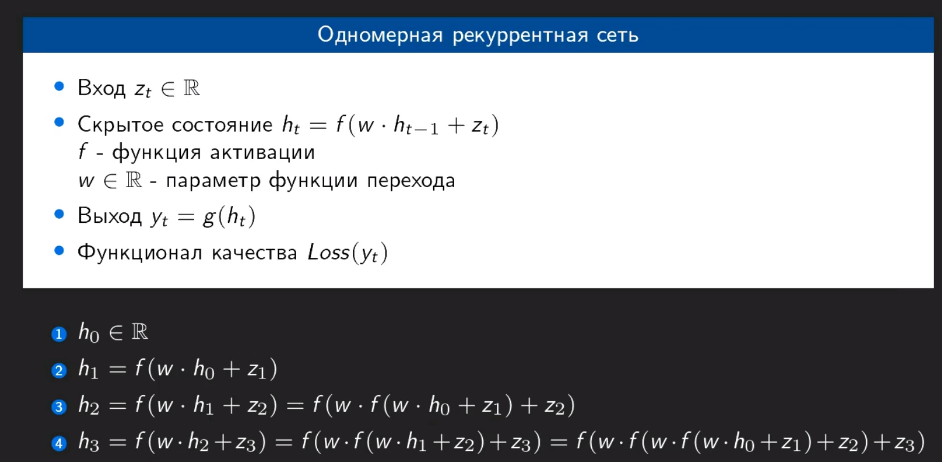

In [4]:
Image('Untitled42.png')

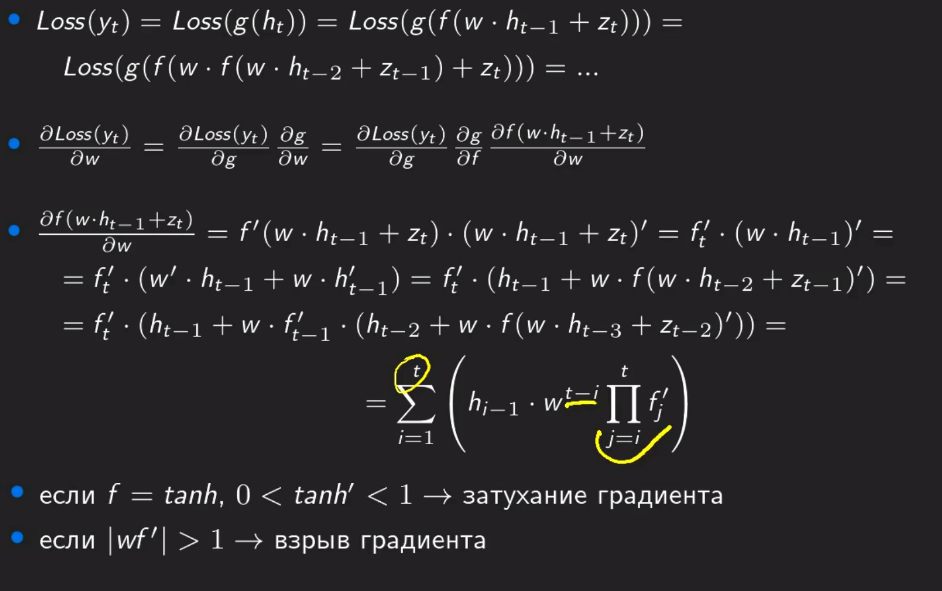

In [8]:
#Расчет производной лос функции
Image('Untitled44.png')

In [7]:
#Из-за последовательного произведения весов, может произойти "взрыв" градиента, например если w = 10 и 200 шагов, 
#Тогда градиент будет умножаться на w**200...

In [ ]:
#Градиент - это вектор направления. Если его клипать ровно как говорится в видео (то есть каждый элемент вектора 
#независимо обрезать, как это делает, например, tensor.clamp в pytorch), то после клиппинга вектор будет указывать 
#в другом направлении и процесс обучения может перестать сходиться. Например, если изначально градиент был [0.1, 100], 
#то после клиппинга с порогом 1 он станет [0.1, 1].

#В PyTorch есть две функции для gradient clipping:.
#clip_grad_value_ - делает ровно то, что говорится в лекции (заменяет значение градиента на порог, если значение 
#превосходит порог по модулю). При этом направление вектора меняется.
#clip_grad_norm_ - масштабирует весь вектор градиента так, чтобы его норма (считай длина) не превышала заданный 
#порог. При этом направление вектора градиента не меняется.

#Что лучше использовать - надо пробовать в каждом конкретном случае. clip_grad_norm_ более корректный математически, 
#но может приводить к тому, что обучение будет слишком медленным, а clip_grad_value_ может приводить к расхождению 
#процесса обучения (далеко не всегда), но не замедляет этот процесс.

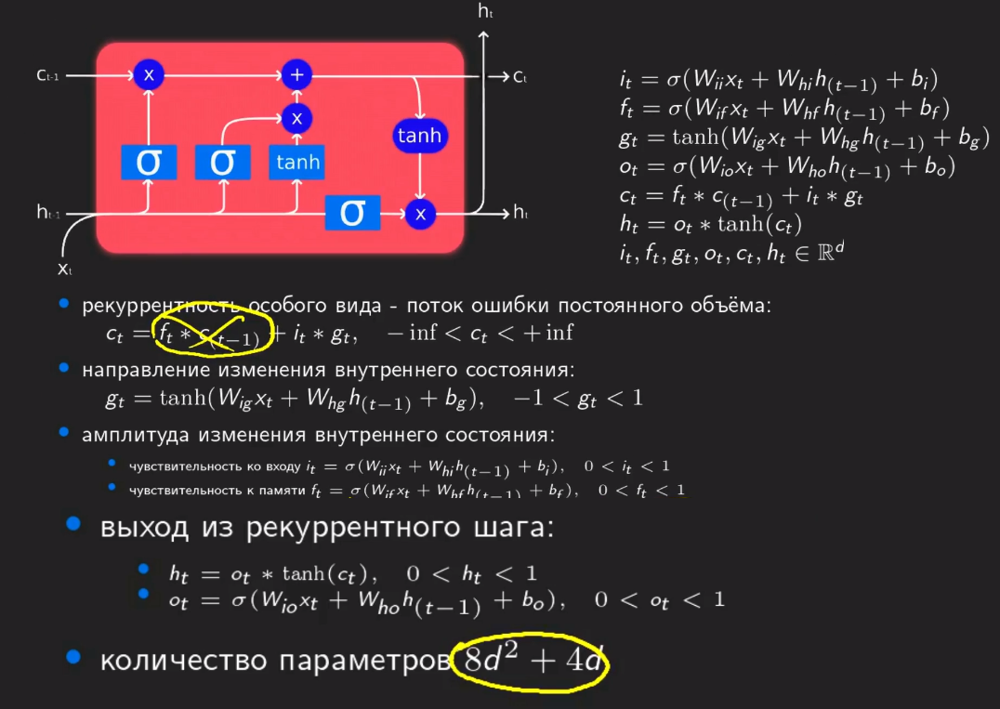

In [10]:
#Long short-term memory  (LSTM – сети долгой краткосрочной памяти)
#Гейтинг - борьба с взрывом и затуханием градиента
#i - input gate
#o - output gate
Image('Untitled47.png')

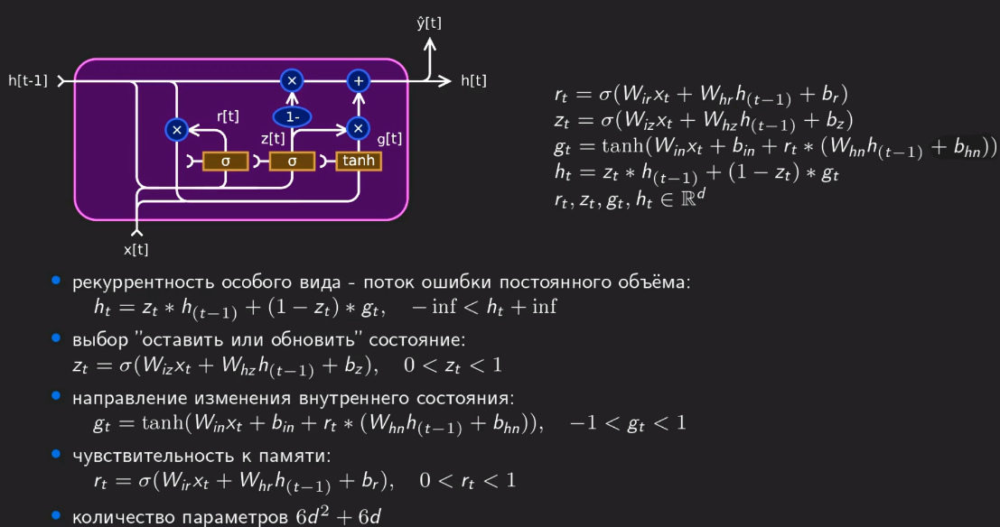

In [11]:
#GRU (англ. Gated Recurrent Units, GRU) - Управляемые рекуррентные блоки 
Image('Untitled48.png')

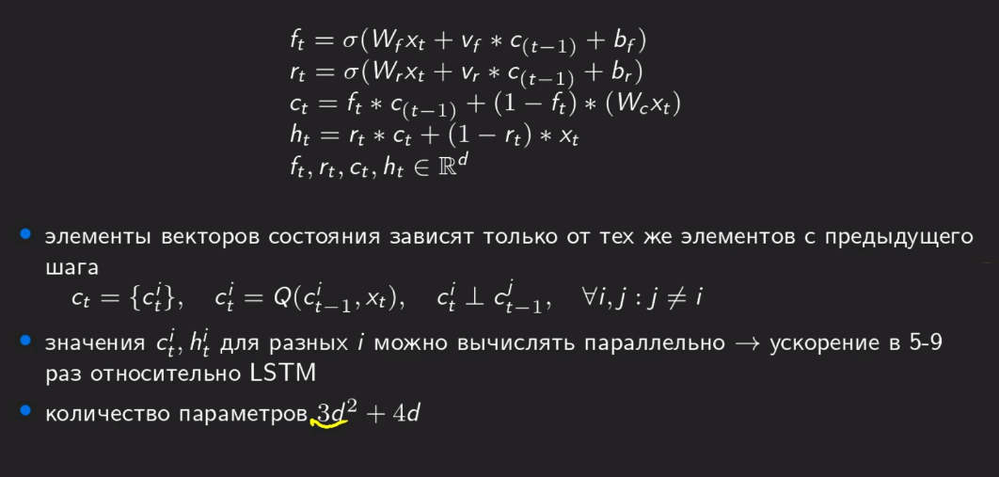

In [12]:
#Simple recurent unit
Image('Untitled52.png')

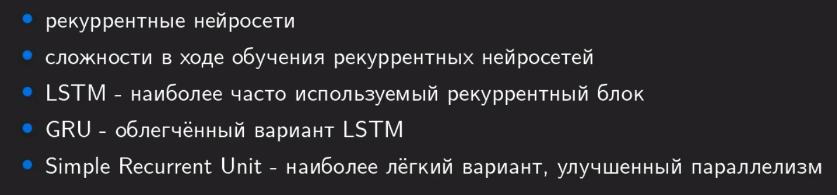

In [13]:
#Основные применяемые блоки
Image('Untitled53.png')

# 1.11 Моделирование языка

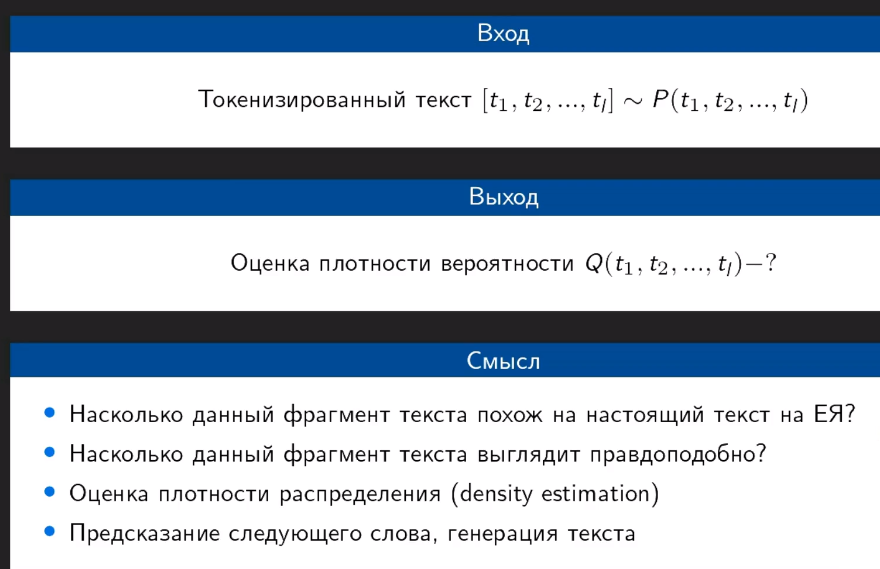

In [14]:
Image('Untitled51.png')

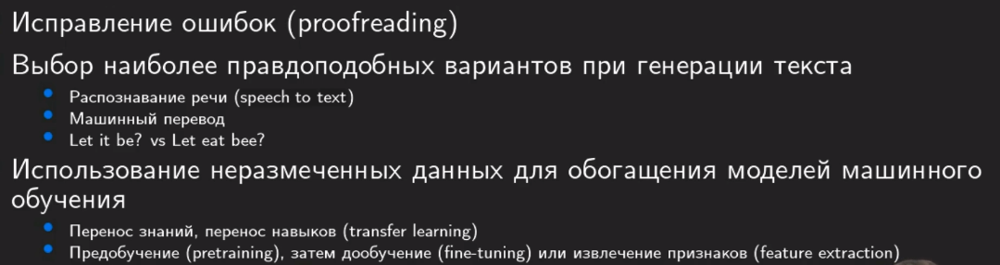

In [15]:
#Задачи для обработки текста
Image('Untitled56.png')

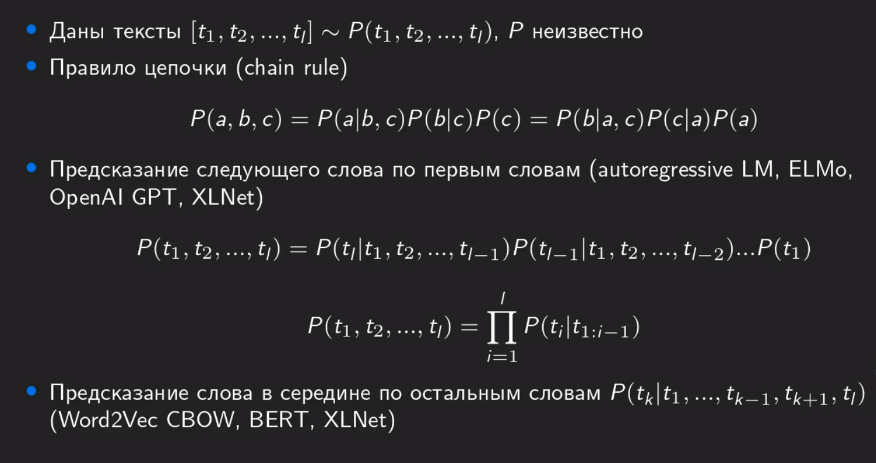

In [16]:
#1)Предсказание каждого следующего слова по предыдущим
#2)Предсказание центрального слова по окружающим
#P(a|b, c) - означает, увидеть а при б и с
Image('Untitled58.png')

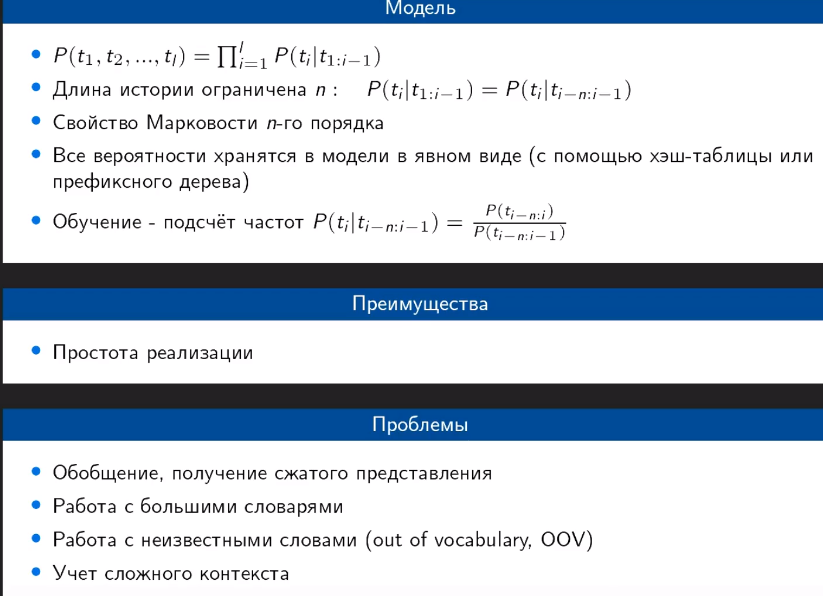

In [17]:
Image('Untitled59.png')

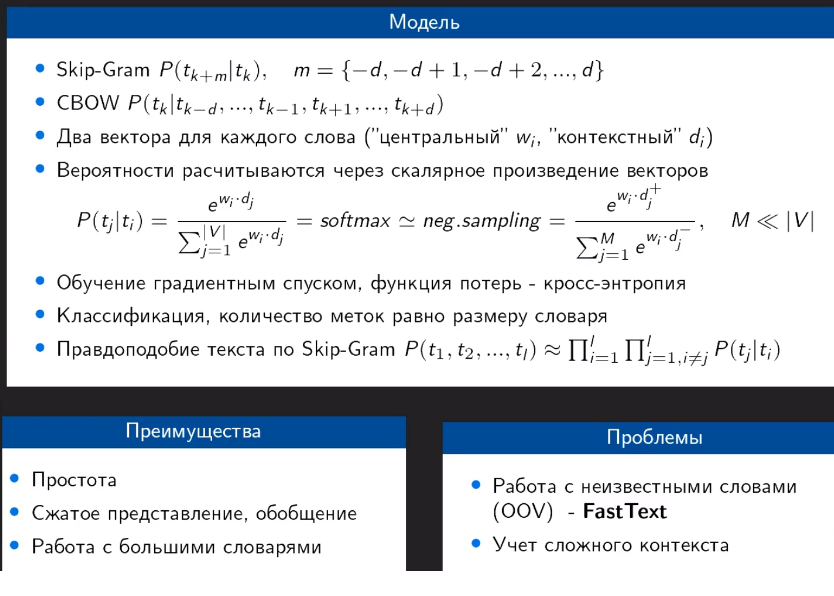

In [18]:
Image('Untitled61.png')

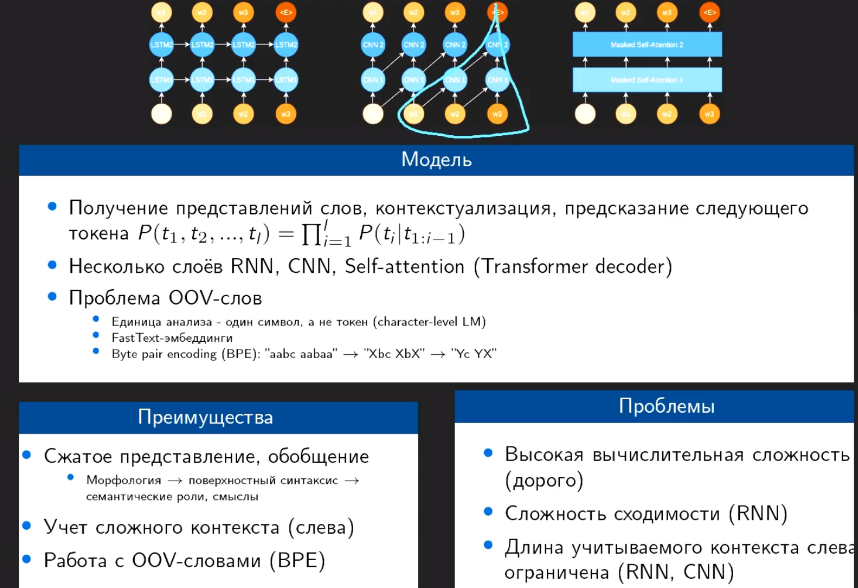

In [20]:
Image('Untitled63.png')

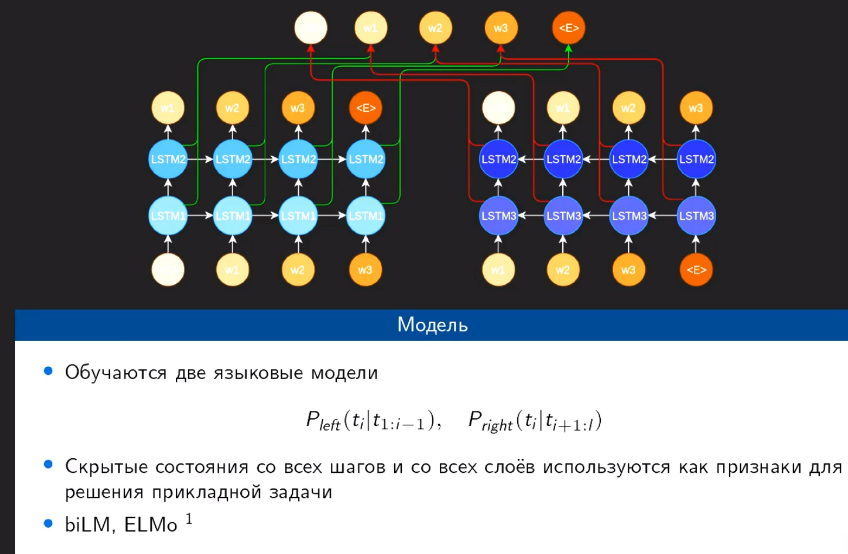

In [21]:
#Двунаправленные регрессионные модели
Image('Untitled65.png')

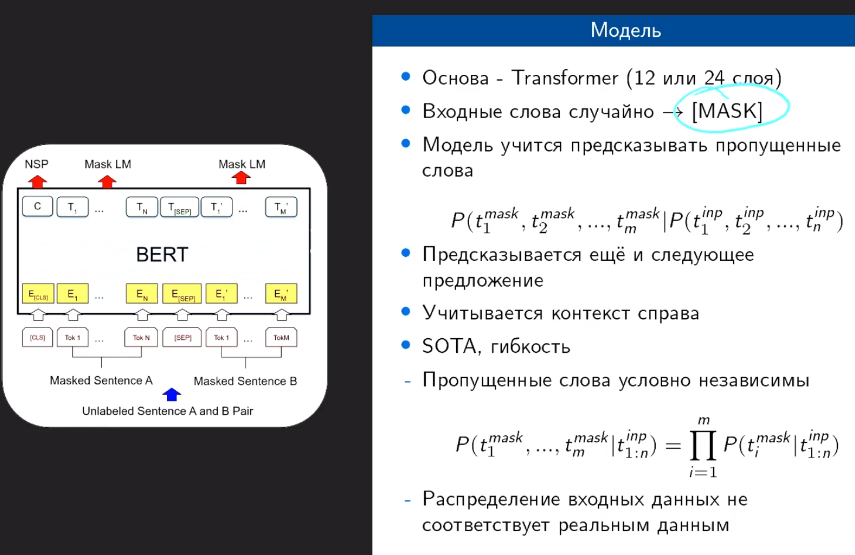

In [22]:
#BERT
Image('Untitled66.png')

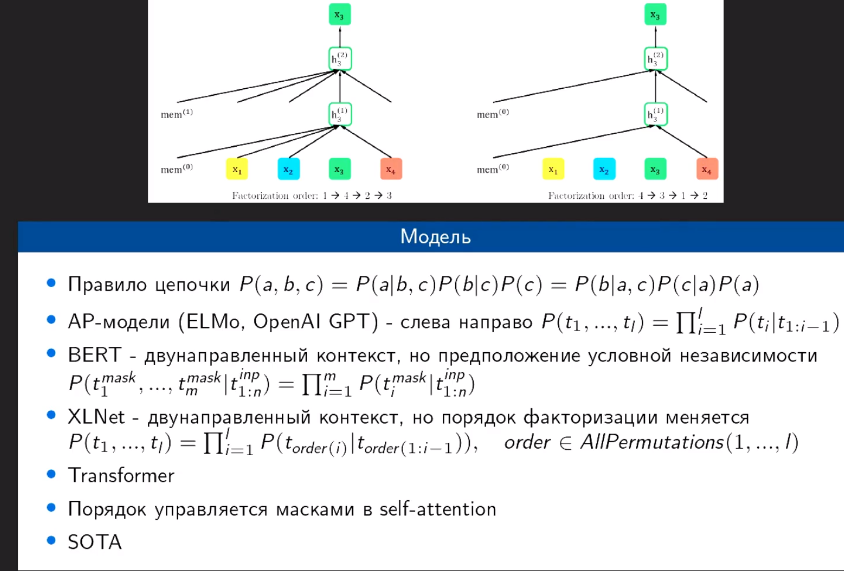

In [23]:
#EXELNET
Image('Untitled67.png')

# 1.12 Генерация текста с помощью рекуррентных нейронных сетей

(по мотивам [семинара](https://github.com/neychev/harbour_dlia2019/blob/master/day02_Simple_RNN/Day_2_Simple_RNN_pytorch.ipynb)
 [курса "Deep Learning in Applications"](https://in.harbour.space/data-science/deep-learning-in-applications-radoslav-neychev-anastasia-ianina/))

In [ ]:
# Если Вы запускаете ноутбук на colab или kaggle,
# выполните следующие строчки, чтобы подгрузить библиотеку dlnlputils:

# !git clone https://github.com/Samsung-IT-Academy/stepik-dl-nlp.git && pip install -r stepik-dl-nlp/requirements.txt
# import sys; sys.path.append('./stepik-dl-nlp')

In [1]:
import os

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Данные
Датасет содержит ~9k имен, все написаны латиницей.

In [2]:
# Если Вы запускаете ноутбук на colab или kaggle, добавьте в начало пути ./stepik-dl-nlp
with open('datasets/russian_names.txt') as input_file:
    names = input_file.read()[:-1].split('\n')
    names = [' ' + line for line in names]

In [3]:
names[:5]

[' Ababko', ' Abaev', ' Abagyan', ' Abaidulin', ' Abaidullin']

Посмотрим на распределение длин имен:

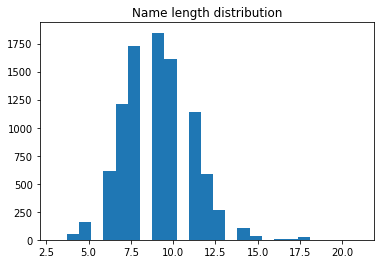

In [4]:
plt.title('Name length distribution')
plt.hist(list(map(len, names)), bins=25);

# Препроцессинг

In [7]:
#all unique characters go here
tokens = list(set(''.join(names)))

num_tokens = len(tokens)
print ('num_tokens = ', num_tokens)

num_tokens =  53


### Символы -> id

Создадим словарь < символ > -> < id >

In [8]:
token_to_id = {token: idx for idx, token in enumerate(tokens)}

In [9]:
assert len(tokens) == len(token_to_id), "dictionaries must have same size"

for i in range(num_tokens):
    assert token_to_id[tokens[i]] == i, "token identifier must be it's position in tokens list"

print("Seems alright!")

Seems alright!


In [107]:
def to_matrix(data, token_to_id, max_len=None, dtype='int32', batch_first = True):
    """Casts a list of names into rnn-digestable matrix"""
    
    max_len = max_len or max(map(len, data))
    data_ix = np.zeros([len(data), max_len], dtype) + token_to_id[' ']

    for i in range(len(data)):
        line_ix = [token_to_id[c] for c in data[i]]
        data_ix[i, :len(line_ix)] = line_ix
        
    if not batch_first: # convert [batch, time] into [time, batch]
        data_ix = np.transpose(data_ix)

    return data_ix

In [11]:
#Example: cast 4 names to matrices, pad with zeros
print('\n'.join(names[::2000]))
print(to_matrix(names[::2000], token_to_id))

 Ababko
 Chihachev
 Isaikov
 Nakhamkin
 Ustenko
[[13 39 52  0 52 34 43 13 13 13]
 [13 35 48 15 48  0 22 48 42 29]
 [13 41 23  0 15 34 43 29 13 13]
 [13  5  0 34 48  0  1 34 15 30]
 [13 33 23 20 42 30 34 43 13 13]]


# Padding в PyTorch осуществляется с помощью torch.nn.utils.rnn.pad_sequence

In [28]:
>>> from torch.nn.utils.rnn import pad_sequence
>>> a = torch.ones(25, 300)
>>> b = torch.ones(22, 300)
>>> c = torch.ones(15, 300)
>>> pad_sequence([a, b, c], padding_value=10)

tensor([[[ 1.,  1.,  1.,  ...,  1.,  1.,  1.],
         [ 1.,  1.,  1.,  ...,  1.,  1.,  1.],
         [ 1.,  1.,  1.,  ...,  1.,  1.,  1.]],

        [[ 1.,  1.,  1.,  ...,  1.,  1.,  1.],
         [ 1.,  1.,  1.,  ...,  1.,  1.,  1.],
         [ 1.,  1.,  1.,  ...,  1.,  1.,  1.]],

        [[ 1.,  1.,  1.,  ...,  1.,  1.,  1.],
         [ 1.,  1.,  1.,  ...,  1.,  1.,  1.],
         [ 1.,  1.,  1.,  ...,  1.,  1.,  1.]],

        ...,

        [[ 1.,  1.,  1.,  ...,  1.,  1.,  1.],
         [10., 10., 10.,  ..., 10., 10., 10.],
         [10., 10., 10.,  ..., 10., 10., 10.]],

        [[ 1.,  1.,  1.,  ...,  1.,  1.,  1.],
         [10., 10., 10.,  ..., 10., 10., 10.],
         [10., 10., 10.,  ..., 10., 10., 10.]],

        [[ 1.,  1.,  1.,  ...,  1.,  1.,  1.],
         [10., 10., 10.,  ..., 10., 10., 10.],
         [10., 10., 10.,  ..., 10., 10., 10.]]])

# Рекуррентные нейронные сети

<img src="img/rnn.png" width=480>

In [124]:
import torch, torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable

In [125]:
class CharRNNCell(nn.Module):
    """
    Implement the scheme above as torch module
    """
    def __init__(self, num_tokens=len(tokens), embedding_size=16, rnn_num_units=64):
        super(self.__class__,self).__init__()
        self.num_units = rnn_num_units
        
        self.embedding = nn.Embedding(num_tokens, embedding_size)
        self.rnn_update = nn.Linear(embedding_size + rnn_num_units, rnn_num_units)
        self.rnn_to_logits = nn.Linear(rnn_num_units, num_tokens)
        
    def forward(self, x, h_prev):
        """
        This method computes h_next(x, h_prev) and log P(x_next | h_next)
        We'll call it repeatedly to produce the whole sequence.
        
        :param x: batch of character ids, variable containing vector of int64
        :param h_prev: previous rnn hidden states, variable containing matrix [batch, rnn_num_units] of float32
        """
        # get vector embedding of x
        x_emb = self.embedding(x)
        
        # compute next hidden state using self.rnn_update
        x_and_h = torch.cat([x_emb, h_prev], dim=1) #YOUR CODE HERE
        h_next = self.rnn_update(x_and_h) #YOUR CODE HERE
        
        h_next = F.tanh(h_next)
        
        assert h_next.size() == h_prev.size()
        
        #compute logits for next character probs
        logits = self.rnn_to_logits(h_next)
        
        return h_next, F.log_softmax(logits, -1)
    
    def initial_state(self, batch_size):
        """ return rnn state before it processes first input (aka h0) """
        return Variable(torch.zeros(batch_size, self.num_units))

In [126]:
char_rnn = CharRNNCell()

### Тренировка сети, RNN loop

In [31]:
def rnn_loop(rnn, batch_index):
    """
    Computes log P(next_character) for all time-steps in names_ix
    :param names_ix: an int32 matrix of shape [batch, time], output of to_matrix(names)
    """
    batch_size, max_length = batch_index.size()
    hid_state = rnn.initial_state(batch_size)
    logprobs = []

    for x_t in batch_index.transpose(0,1):
        hid_state, logp_next = rnn(x_t, hid_state)  
        logprobs.append(logp_next)
        
    return torch.stack(logprobs, dim=1)

### Тренировка сети

In [122]:
from IPython.display import clear_output
from random import sample

char_rnn = CharRNNCell()
opt = torch.optim.Adam(char_rnn.parameters())
history = []

In [123]:
MAX_LENGTH = max(map(len, names))

for i in range(1000):
    batch_ix = to_matrix(sample(names, 32), token_to_id, max_len=MAX_LENGTH)
    batch_ix = torch.tensor(batch_ix, dtype=torch.int64)
    
    logp_seq = rnn_loop(char_rnn, batch_ix)
    
    # compute loss
    predictions_logp = logp_seq[:, :-1]
    actual_next_tokens = batch_ix[:, 1:]

    loss = -torch.mean(torch.gather(predictions_logp, dim=2, index=actual_next_tokens[:,:,None]))###YOUR CODE
    
    # train with backprop
    loss.backward()
    opt.step()
    opt.zero_grad()
    
    # visualizing training process
    history.append(loss.data.numpy())
    if (i + 1) % 100 == 0:
        clear_output(True)
        plt.plot(history,label='loss')
        plt.legend()
        plt.show()

assert np.mean(history[:10]) > np.mean(history[-10:]), "RNN didn't converge."

RuntimeError: index out of range: Tried to access index 60 out of table with 52 rows. at C:\w\1\s\tmp_conda_3.7_104508\conda\conda-bld\pytorch_1572950778684\work\aten\src\TH/generic/THTensorEvenMoreMath.cpp:418

### RNN: генерация имен

In [34]:
def generate_sample(char_rnn, seed_phrase=' ', max_length=MAX_LENGTH, temperature=1.0):
    '''
    The function generates text given a phrase of length at least SEQ_LENGTH.
    :param seed_phrase: prefix characters. The RNN is asked to continue the phrase
    :param max_length: maximum output length, including seed_phrase
    :param temperature: coefficient for sampling.  higher temperature produces more chaotic outputs,
                        smaller temperature converges to the single most likely output
    '''
    
    x_sequence = [token_to_id[token] for token in seed_phrase]
    x_sequence = torch.tensor([x_sequence], dtype=torch.int64)
    hid_state = char_rnn.initial_state(batch_size=1)
    
    #feed the seed phrase, if any
    for i in range(len(seed_phrase) - 1):
        hid_state, _ = char_rnn(x_sequence[:, i], hid_state)
    
    #start generating
    for _ in range(max_length - len(seed_phrase)):
        hid_state, logp_next = char_rnn(x_sequence[:, -1], hid_state)
        p_next = F.softmax(logp_next / temperature, dim=-1).data.numpy()[0]
        
        # sample next token and push it back into x_sequence
        next_ix = np.random.choice(len(tokens), p=p_next)
        next_ix = torch.tensor([[next_ix]], dtype=torch.int64)
        x_sequence = torch.cat([x_sequence, next_ix], dim=1)
        
    return ''.join([tokens[ix] for ix in x_sequence.data.numpy()[0]])

In [35]:
for _ in range(10):
    print(generate_sample(char_rnn))

 Zhelneks            
 Ebiitov             
 Balylyadok          
 Milhetuk            
 Bahakidanko         
 Rukhursev           
 Agshpenkov          
 Hojlyahovich        
 Zhbomov             
 Shezhizhskk         


In [37]:
for _ in range(10):
    print(generate_sample(char_rnn, seed_phrase=' Ar', temperature=0.2)) 
#чем меньше температура, тем сеть уверннее в ответе

#Температура в softmax - параметр, который отвечает за “случайность” итогового распределения. 
#Если устремить температуру к нулю, итоговое распределение вырождается в one-hot (элемент с максимальным значением 
#выбирается с вероятностью 1.0). Такое поведение согласуется и с физическими явлениями. С возрастанием температуры 
#энтропия (мера хаотичности) системы растет, а значит события становятся более случайными (т.е. распределение 
#стремится к равномерному).
#Исходя из информации выше, выберите правильные утверждения:

C:\Users\Titan\Anaconda3\lib\site-packages\torch\nn\functional.py:1340: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


 Aralinov            
 Araranov            
 Aralov              
 Aralov              
 Ararenkov           
 Aralin              
 Aralin              
 Aralin              
 Aranov              
 Araevsky            


### Более простое решение

* `nn.RNNCell(emb_size, rnn_num_units)` - шаг RNN. Алгоритм: concat-linear-tanh
* `nn.RNN(emb_size, rnn_num_units` - весь rnn_loop.

Кроме того, в PyTorch есть `nn.LSTMCell`, `nn.LSTM`, `nn.GRUCell`, `nn.GRU`, etc. etc.

Перепишем наш пример с генерацией имен с помощью средств PyTorch.

In [83]:
class CharRNNLoop(nn.Module):
    def __init__(self, num_tokens=num_tokens, emb_size=16, rnn_num_units=64):
        super(self.__class__, self).__init__()
        self.emb = nn.Embedding(num_tokens, emb_size)
        self.rnn = nn.RNN(emb_size, rnn_num_units, batch_first=True)
        self.hid_to_logits = nn.Linear(rnn_num_units, num_tokens)
        
    def forward(self, x):
        assert isinstance(x, Variable) and isinstance(x.data, torch.LongTensor)
        h_seq, _ = self.rnn(self.emb(x))
        next_logits = self.hid_to_logits(h_seq)
        next_logp = F.log_softmax(next_logits, dim=-1)
        return next_logp
    
model = CharRNNLoop()
opt = torch.optim.Adam(model.parameters())
history = []

In [101]:
MAX_LENGTH = max(map(len, names))

for i in range(1000):
    batch_ix = to_matrix(sample(names, 32), token_to_id, max_len=MAX_LENGTH)
    batch_ix = torch.tensor(batch_ix, dtype=torch.int64)
    
    logp_seq = model(batch_ix)
    
    # compute loss
    predictions_logp = logp_seq[:, :-1]
    actual_next_tokens = batch_ix[:, 1:]

    loss = -torch.mean(torch.gather(predictions_logp, dim=2, index=actual_next_tokens[:,:,None]))
    
    # train with backprop
    loss.backward()
    opt.step()
    opt.zero_grad()
    
    history.append(loss.data.numpy())
    if (i + 1) % 100 == 0:
        clear_output(True)
        plt.plot(history, label='loss')
        plt.legend()
        plt.show()

assert np.mean(history[:25]) > np.mean(history[-25:]), "RNN didn't converge."

ValueError: invalid literal for int() with base 10: 'token_to_id[c]'

In [45]:
for _ in range(10):
    print(generate_sample(char_rnn, temperature=0.2))

 Avikhenko           
 Valin               
 Abulin              
 Haranin             
 Mokhanov            
 Malin               
 Abalov              
 Harovsky            
 Abalin              
 Jakhanov            


### Что еще можно генерировать?
С помощью кода из этого семинара можно генерировать не только имена, но и:

* Повести/романы/поэзию/песни любимого автора
* Новостные заголовки
* Программный код
* Молекулы в формате [smiles](https://en.wikipedia.org/wiki/Simplified_molecular-input_line-entry_system)
* Музыку
* Названия мебели из ИКЕА
* Мотивационные лозунги
* etc.

__Удачи!__

### Домашнее задание: мотивационные лозунги

In [ ]:
# Если Вы запускаете ноутбук на colab или kaggle, добавьте в начало пути ./stepik-dl-nlp
with open('datasets/author_quotes.txt') as input_file:
    quotes = input_file.read()[:-1].split('\n')
    quotes = [' ' + line for line in quotes]

In [ ]:
quotes[:5]

In [ ]:
tokens = list(set(''.join(quotes)))
token_to_id = {token: idx for idx, token in enumerate(tokens)}
num_tokens = len(tokens)

In [ ]:
# your code here

# 1.13 Агрегация текста: пулинг и механизм внимания

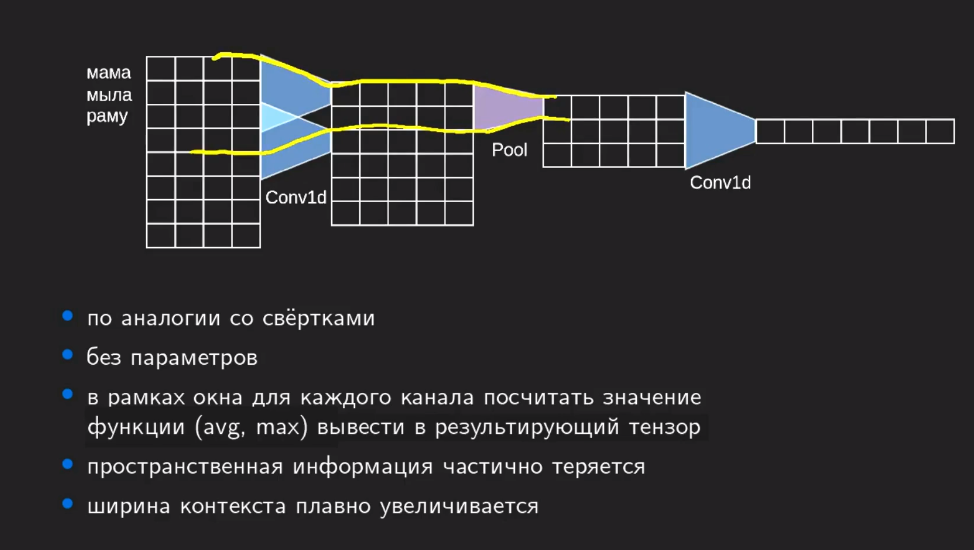

In [1]:
#Агрегация глобального контекста
from IPython.display import Image #display picture
Image('Untitled69.png')

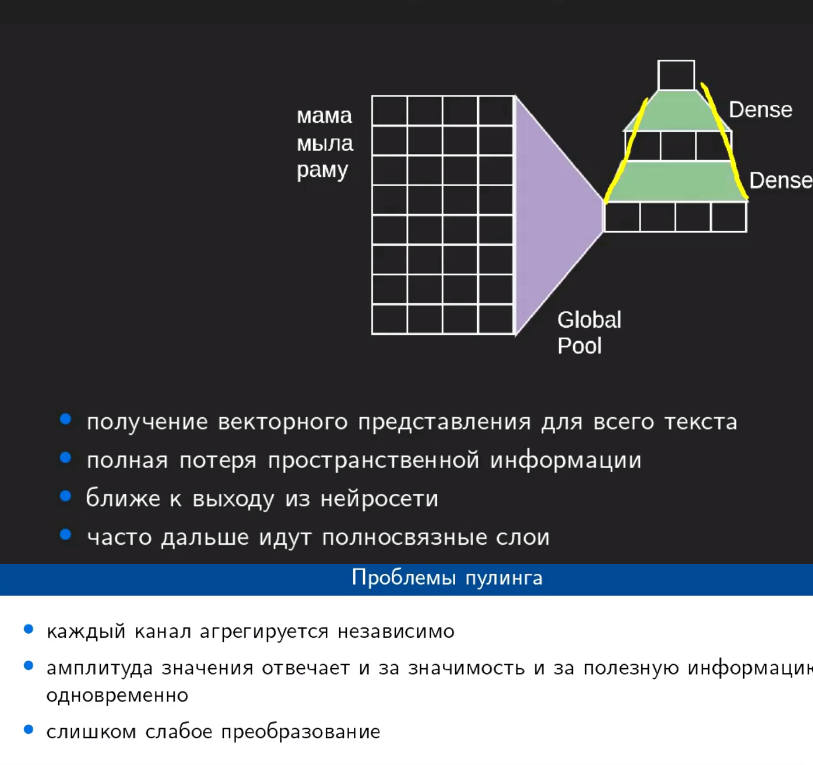

In [4]:
#Глобальный пуллинг
Image('Untitled71.png')

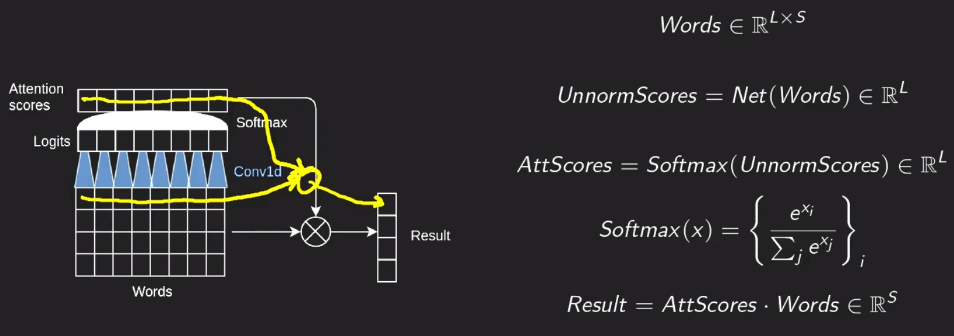

In [5]:
#Механизм внимания
Image('Untitled72.png')

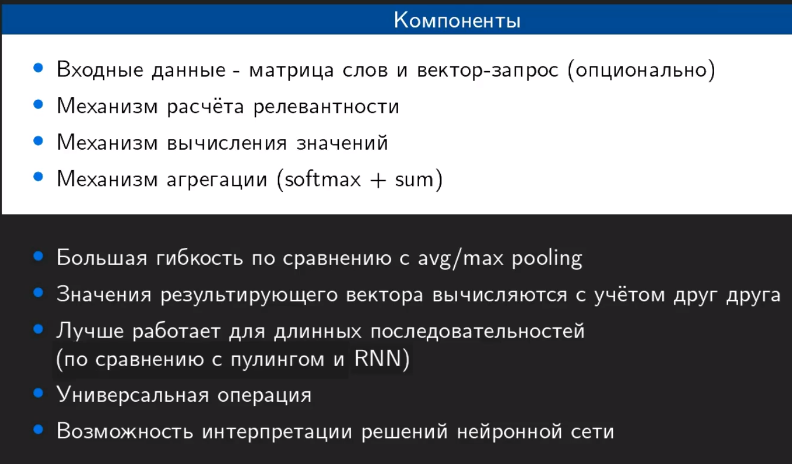

In [8]:
Image('Untitled73.png')

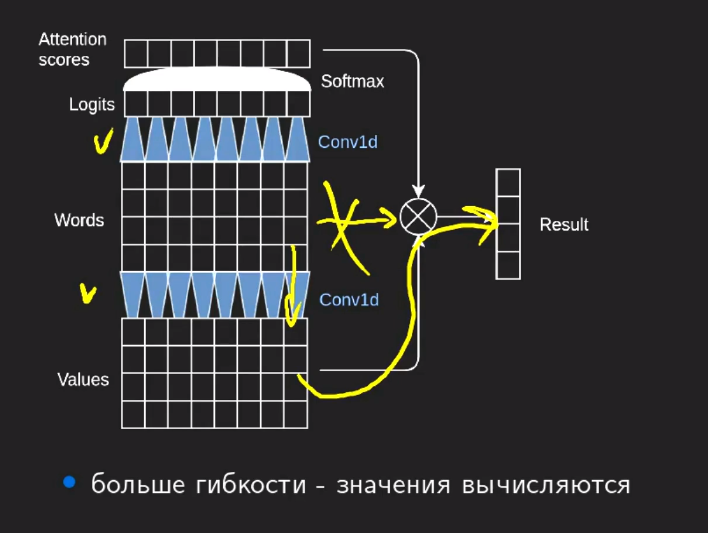

In [9]:
#Вариант реализации механизма внимания
Image('Untitled74.png')

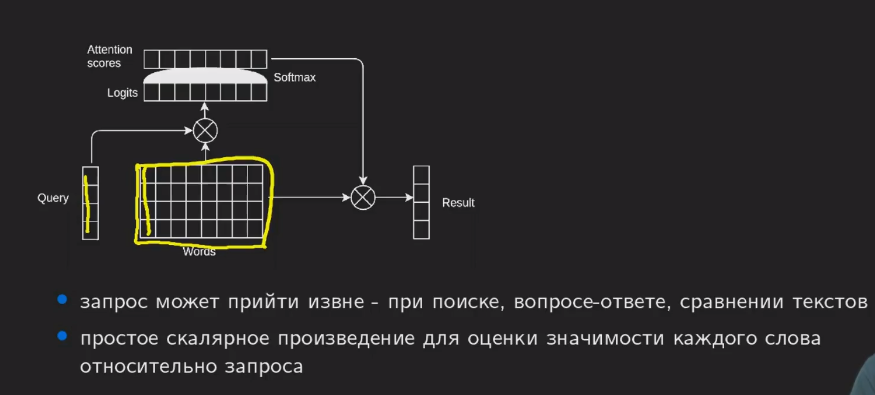

In [10]:
Image('Untitled75.png')

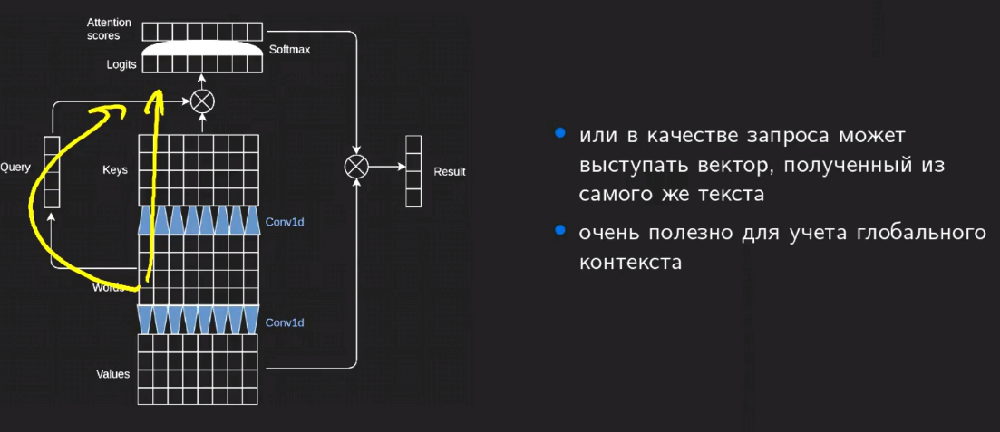

In [11]:
Image('Untitled81.png')

In [13]:
import numpy as np
from scipy.special import softmax

In [37]:
x = np.array([[1, 0, 2],
               [0, 1, 3],
               [1, 3, 0],
               [0, 0, 0]])

Query = np.array([[0],
                 [0],
                 [1]])
UnnormScores = np.matmul(x, Query)

AttScores = softmax(UnnormScores)
out = sum(AttScores*x)
out

array([0.28461991, 0.78323514, 2.54574246])

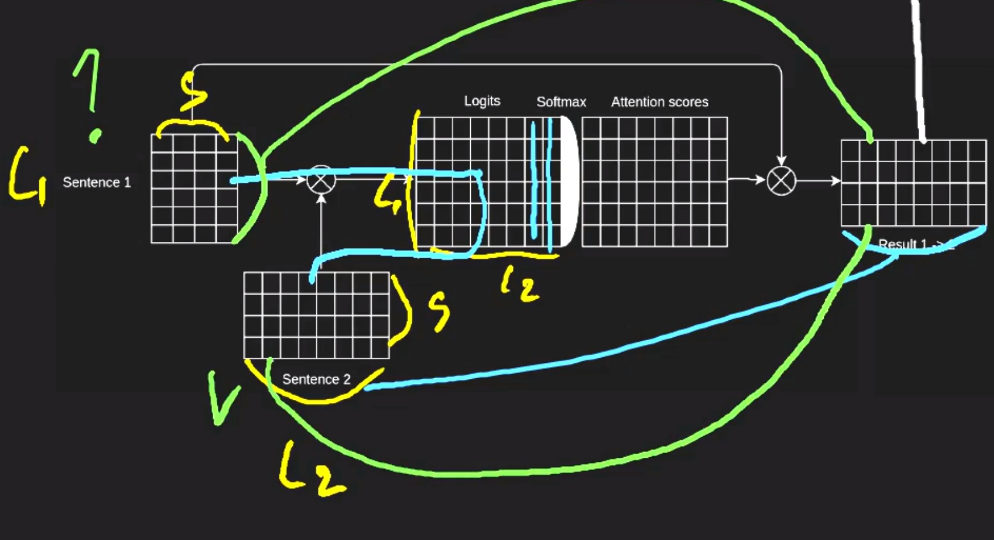

In [38]:
#Сравнение двух текстов через взаимный интерес
#Нормализация по столбцам
Image('Untitled78.png')

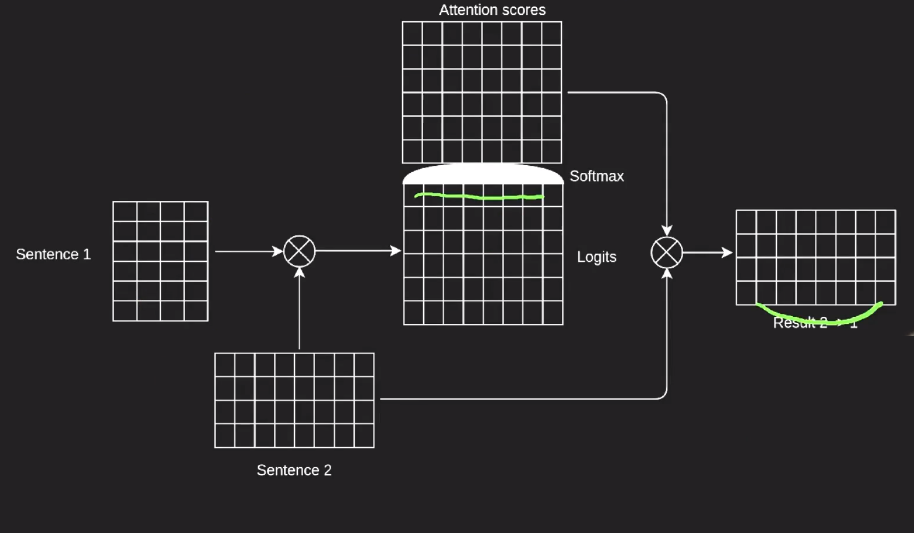

In [39]:
#Нормализация по строкам
Image('Untitled79.png')

# 1.14 Трансформер и self-attention

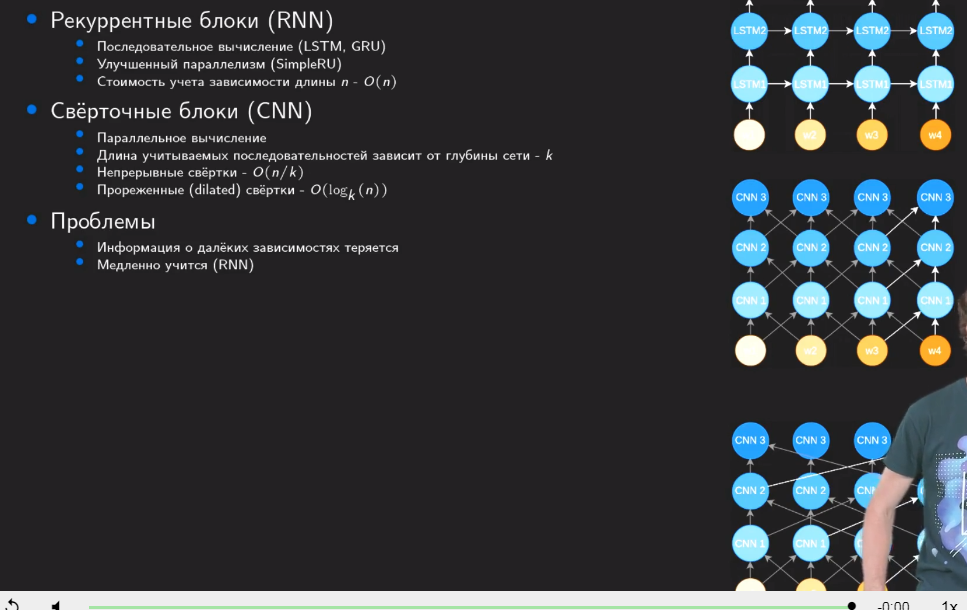

In [40]:
#Виды блоков
Image('Untitled82.png')

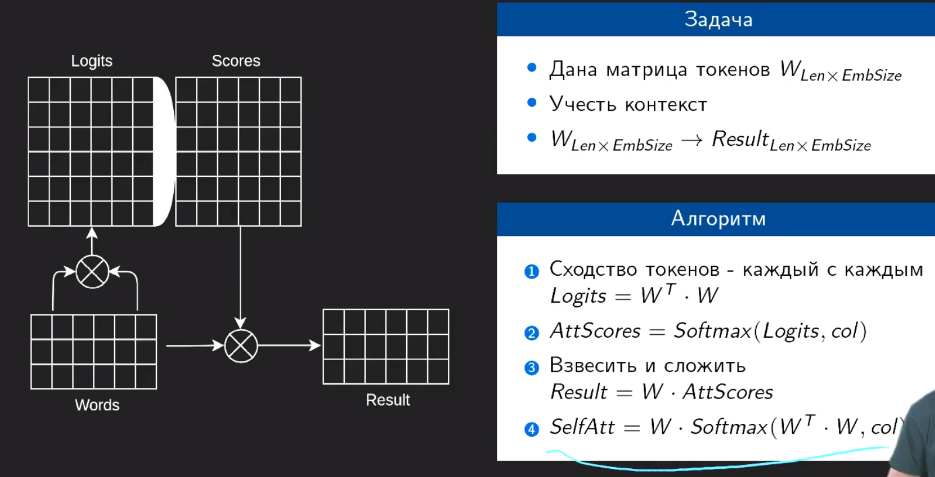

In [41]:
#Механизм внутреннего внимания
Image('Untitled84.png')

In [69]:
In = np.array([[1, 0],
               [0, 1],
               [1, 1],
               [0, 0]])
Logits = In@In.T          #Умножение на саму себя, для выявления попарных последовательностей
AttScores = softmax(Logits, axis=1)
AttScores@In

array([[0.73105858, 0.5       ],
       [0.5       , 0.73105858],
       [0.73105858, 0.73105858],
       [0.5       , 0.5       ]])

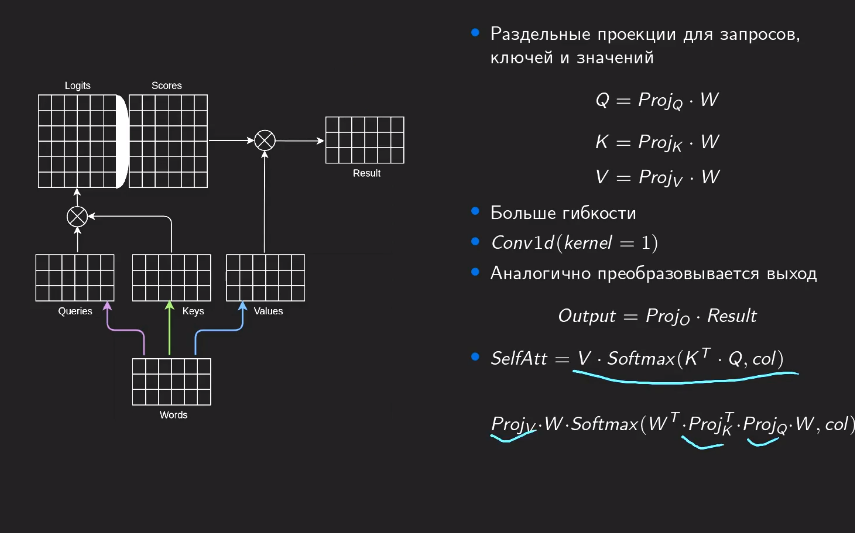

In [42]:
#Сложный вариант внимания 
Image('Untitled86.png')

In [20]:
import numpy as np
from scipy.special import softmax

In = np.array([[1, 0],
               [0, 1],
               [1, 1],
               [0, 0]])
Proj_K = np.array([[1, 0],
                   [0, 0]])
Proj_Q = np.array([[0, 0],
                   [1, 0]])
Proj_V = np.array([[1, 0],
                   [0, 1]])

Bias_K = np.array([0, 0])
Bias_Q = np.array([0, 0])
Bias_V = np.array([0, 0])

Keys = In@Proj_K + Bias_K 
Queries = In@Proj_Q + Bias_Q 
Values = In@Proj_V + Bias_V 

Logits = Queries@Keys.T             #попарное сходство
Att_Scores = softmax(Logits, axis=1)

Result = Att_Scores@Values
Result

array([[0.5       , 0.5       ],
       [0.73105858, 0.5       ],
       [0.73105858, 0.5       ],
       [0.5       , 0.5       ]])

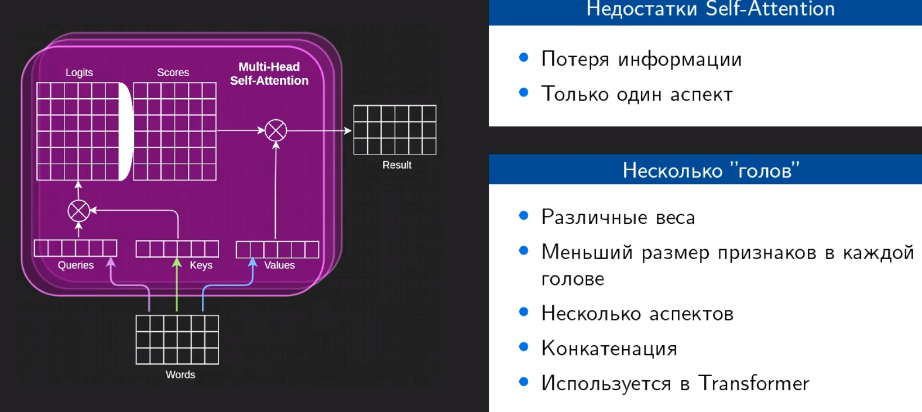

In [22]:
#multihead self-attention
from IPython.display import Image #display picture
Image('Untitled83.png')

In [2]:
import numpy as np
from scipy.special import softmax

In [13]:
##multihead self-attention
In = np.array([[1, 0],
               [0, 1],
               [1, 1],
               [0, 0]])

Proj_K_0 = np.array([[1, 0],
                     [0, 0]])
Proj_K_1 = np.array([[0, 0],
                     [1, 0]])

Proj_Q_0 = np.array([[0, 1],
                     [1, 0]])
Proj_Q_1 = np.array([[1, 1],
                     [1, 1]])

Proj_V_0 = np.array([[1],
                     [0]])
Proj_V_1 = np.array([[0],
                     [1]])

Bias_K_0 = np.array([0, 0])
Bias_K_1 = np.array([0, 0])

Bias_Q_0 = np.array([0, 0])
Bias_Q_1 = np.array([0, 0])

Bias_V_0 = 0
Bias_V_1 = 0

Keys_0 = In@Proj_K_0 + Bias_K_0 
Queries_0 = In@Proj_Q_0 + Bias_Q_0 
Values_0 = In@Proj_V_0 + Bias_V_0

Keys_1 = In@Proj_K_1 + Bias_K_1 
Queries_1 = In@Proj_Q_1 + Bias_Q_1
Values_1 = In@Proj_V_1 + Bias_V_1

Logits_0 = Queries_0@Keys_0.T             #попарное сходство
Logits_1 = Queries_1@Keys_1.T             #попарное сходство

Att_Scores_0 = softmax(Logits_0, axis=1)
Att_Scores_1 = softmax(Logits_1, axis=1)

Result_0 = Att_Scores_0@Values_0
Result_1 = Att_Scores_1@Values_1
np.hstack([Result_0,Result_1])

array([[0.5       , 0.73105858],
       [0.73105858, 0.73105858],
       [0.73105858, 0.88079708],
       [0.5       , 0.5       ]])

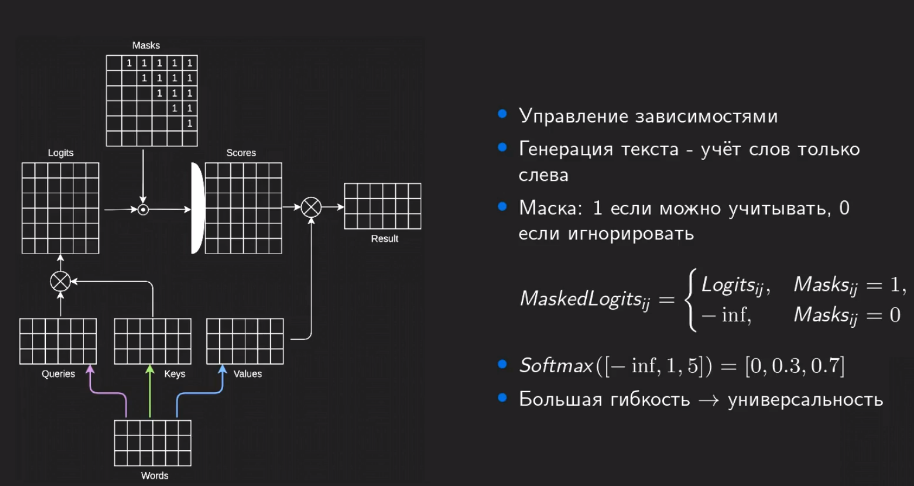

In [14]:
#Masking
from IPython.display import Image #display picture
Image('Untitle.png')

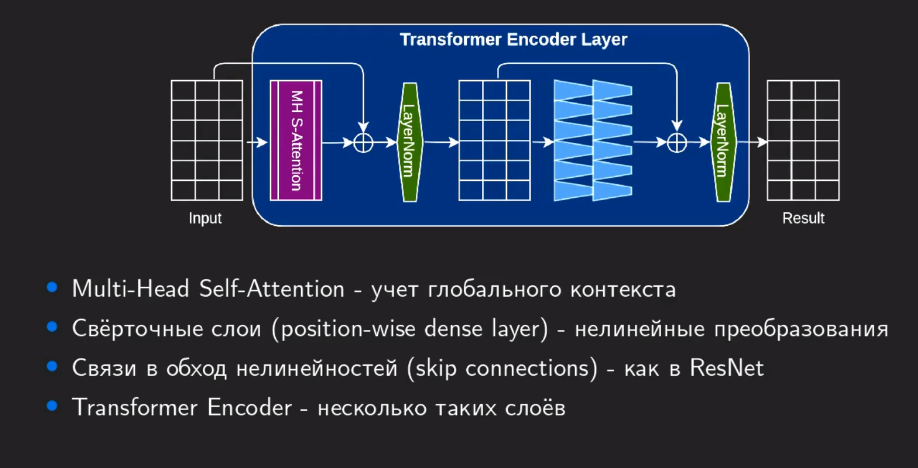

In [15]:
Image('Untitle1.png')

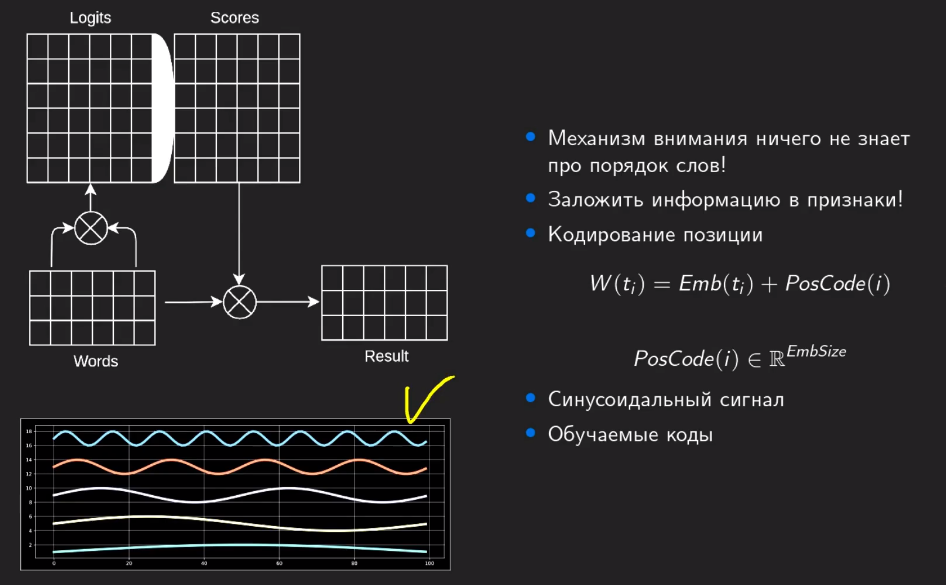

In [16]:
#Учет позиционности
Image('Untitle2.png')

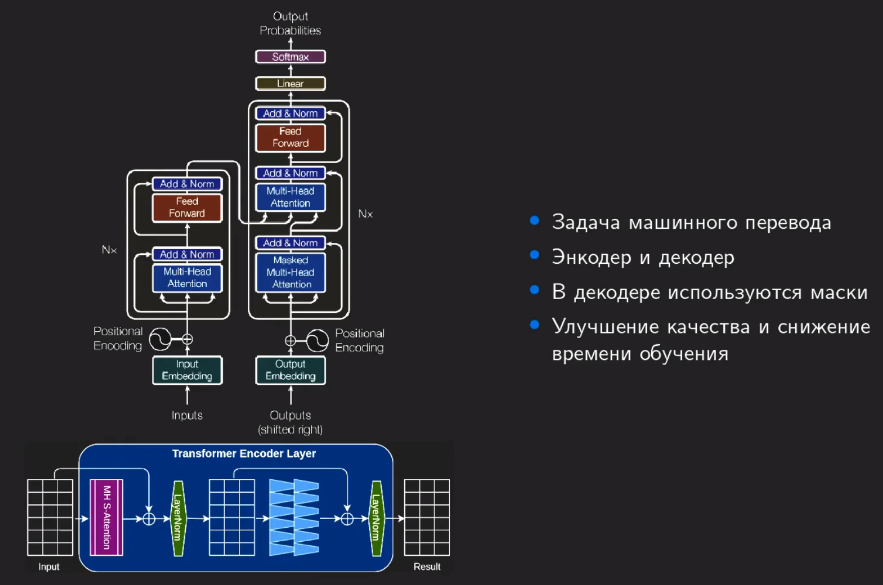

In [17]:
#Общая архитектура нейросети 
Image('Untitle3.png')

In [ ]:
#Зависимости большой длины учитываются за 1 слой self-attention
#Transformer - это несколько слоёв self-attention вместе с нелинейными преобразованиями между ними
#В рамках одного слоя self-attention все элементы последовательности можно обрабатывать параллельно